# Imports Functions

In [49]:
%load_ext autoreload

import numpy as np

from scipy import io
from sklearn.decomposition import NMF

import Support_Functions as sf
import matplotlib.pyplot as plt

from sklearn import (decomposition, preprocessing as pre, cluster,
                     preprocessing, cluster, metrics,
                     model_selection, neighbors)
from matplotlib import (pyplot as plt, animation, colors,
                        ticker, path, patches, patheffects)

from mpl_toolkits.axes_grid1 import make_axes_locatable

import keras
from os.path import join as pjoin

%matplotlib inline

sf.custom_plt_format()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [50]:
import Support_Functions as sf
import imp
imp.reload(sf)

<module 'Support_Functions' from '/Users/joshuaagar/Google Drive/Berkeley_2017/Data_Analysis/Physical_Rev_X_2017/Support_Functions.py'>

# Loads the Data

In [51]:
# loads the data file
data = io.matlab.loadmat('./Data.mat')

# extracts the voltage vector
voltage = data['Voltagedata_mixed']

# extracts the hyteresis loopsb
Piezoresponse = data['Loopdata_mixed']

# interpolates missing points
Piezoresponse = sf.interpolate_missing_points(Piezoresponse).reshape(-1,Piezoresponse.shape[2])

# Topography and Piezoresponse

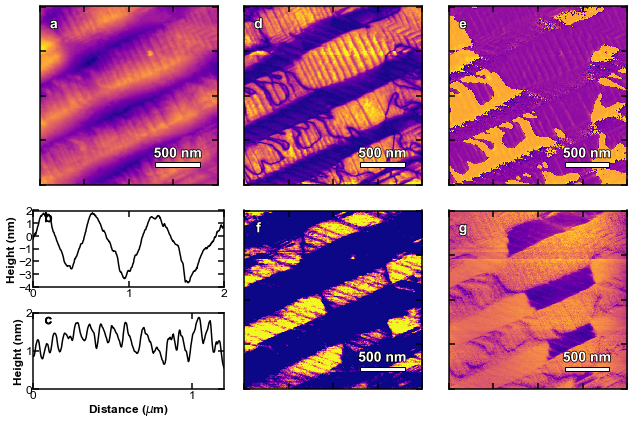

In [4]:
fig = plt.figure(figsize=(9, 6))

ax1 = plt.subplot2grid((4, 6), (0, 0), colspan=2, rowspan=2)
ax2 = plt.subplot2grid((4, 6), (2, 0), colspan=2, rowspan=1)
ax3 = plt.subplot2grid((4, 6), (3, 0), colspan=2, rowspan=1)
ax4 = plt.subplot2grid((4, 6), (0, 2), colspan=2, rowspan=2)
ax5 = plt.subplot2grid((4, 6), (0, 4), colspan=2, rowspan=2)
ax6 = plt.subplot2grid((4, 6), (2, 2), colspan=2, rowspan=2)
ax7 = plt.subplot2grid((4, 6), (2, 4), colspan=2, rowspan=2)

axes = (ax1, ax2, ax3, ax4, ax5, ax6, ax7)

signal_clim = {'Topography': dict(
    c_lim=[],
    data_loc='topo_mixed'),
    'Large-Periodicity Line Trace': dict(
    data_loc='topo_ca_caca_mixed',
    x_lim=[0, 2],
    y_lim=[-4, 2],
    shift=0),
    'Small-Periodicity Line Trace':  dict(
    data_loc='topo_mixed_caca',
    x_lim=[0, 1.2],
    y_lim=[0, 2],
    shift=0.8),
    'Vertical Amplitude': dict(
    c_lim=[0, 4.5e-10],
    data_loc='Vert_Amp_mixed'),
    'Vertical Phase': dict(
    c_lim=[],
    data_loc='vert_phase_mixed'),
    'Lateral Amplitude': dict(
    c_lim=[0, .8e-11],
    data_loc='lateral_amp_mixed'),
    'Lateral Phase': dict(
    c_lim=[],
    data_loc='lateral_phase_mixed')
}

# Plots each of the graphs
for i, (signal, values) in enumerate(signal_clim.items()):

    if 'Trace' not in signal:

        # Plots the graph
        im = axes[i].imshow(
            np.flipud(data[values['data_loc']].T), cmap='plasma')

        # Sets the scales
        if values['c_lim']:
            im.set_clim(values['c_lim'])

        # labels figures
        sf.labelfigs(axes[i], i)

        # Removes axis labels
        axes[i].set_xticklabels([])
        axes[i].set_yticklabels([])

        # Sets ticks
        axes[i].set_xticks(np.linspace(
            0, data[values['data_loc']].shape[0], 5))
        axes[i].set_yticks(np.linspace(
            0, data[values['data_loc']].shape[1], 5))

        sf.add_scalebar_to_figure(axes[i], 2000, 500)

    else:

        line_trace = data[values['data_loc']]
        plt1 = axes[i].plot(line_trace[:, 0] * 1e6 -
                            values['shift'], line_trace[:, 1] * 1e9, 'k')

        if 'Small' in signal:
            axes[i].set_xlabel('Distance (${\mu}$m)')

        axes[i].set_ylabel('Height (nm)')
        axes[i].set_xlim(values['x_lim'])
        axes[i].set_ylim(values['y_lim'])
        axes[i].set_xticks(np.arange(values['x_lim'][0],
                                     values['x_lim'][1] + .1, 1))
        axes[i].set_yticks(np.arange(values['y_lim'][0],
                                     values['y_lim'][1] + .1, 1))

        # labels figures
        sf.labelfigs(axes[i], i, style='b')

plt.tight_layout()

sf.savefig('PFM of PZT with Hierarchical Domain Structures')

## Raw Example Data from Measurement

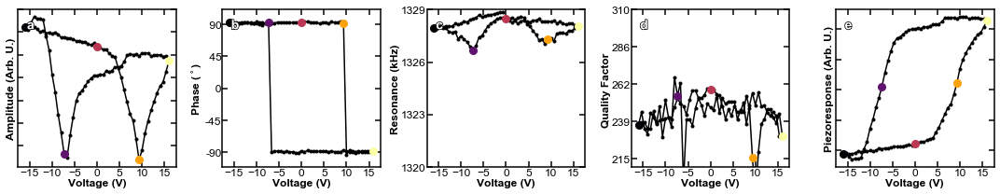

In [5]:
# (User) selects index (index used in main manuscript as example [30,30], cycle 2)
x = 30
y = 30
cycle = 2

# Sets the information for plotting. (User) can adjust scales.
signals = {'Amplitude': dict(
    symbol='A',
    format_str='%.0e',
    units='(Arb. U.)',
    y_lim=[],
    y_tick=[]),
    'Phase': dict(
    symbol='Phi',
    format_str='%3.d',
    units='(${^\circ}$)',
    y_lim=[-110, 110],
    y_tick=np.linspace(-90, 90, 5)),
    'Resonance': dict(
    symbol='w',
    format_str='%3.d',
    units='(kHz)',
    y_lim=[1326, 1329],
    y_tick=np.linspace(1320, 1329, 4)),
    'Quality Factor': dict(
    symbol='Q',
    format_str='%3.f',
    units='',
    y_lim=[210, 310],
    y_tick=np.linspace(215, 310, 5)),
    'Piezoresponse': dict(
    symbol='Piezoresponse',
    format_str='%.0e',
    units='(Arb. U.)',
    y_lim=[],
    y_tick=[])
}

sf.plot_raw_BE_data(x, y, cycle, data, signals, 'Raw_Loops_mixed')

# Principle Component Analysis

In [6]:
# Computes the PCA
# second index represents the number of components to compute
PCA_mixed, _ = sf.conduct_PCA(Piezoresponse,16)

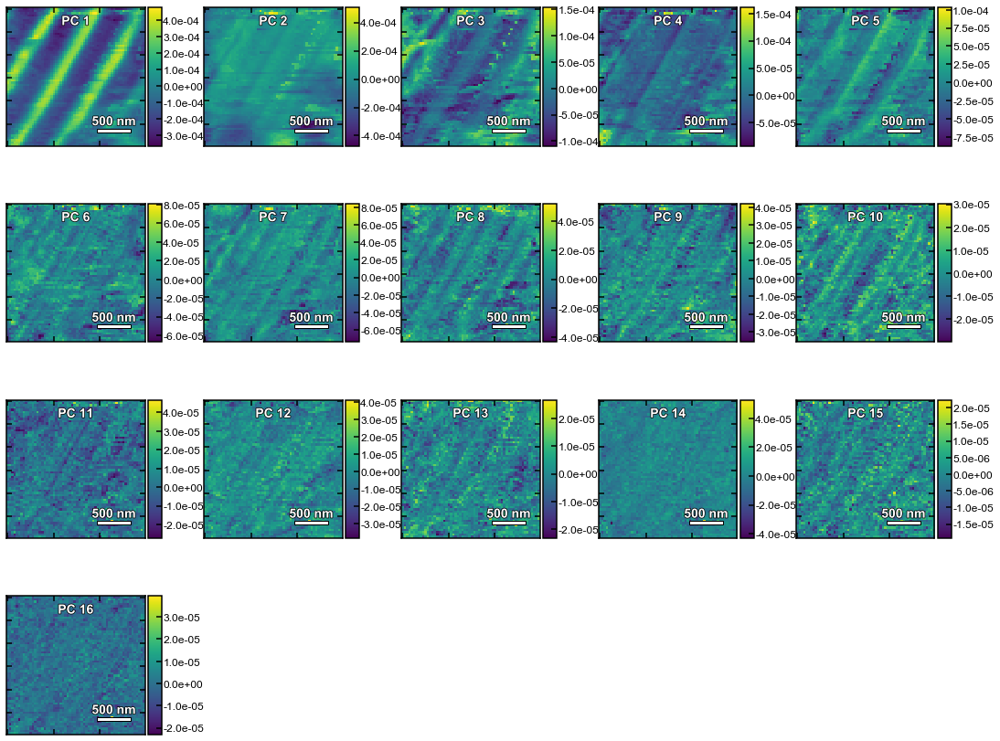

In [7]:
# plots the eigenvalues of the PC
sf.plot_pca_maps(PCA_mixed,
                 Piezoresponse,
                 add_scalebar=[2000,500],
                 filename='./PCA_mixed_maps',
                 print_PNG=True)

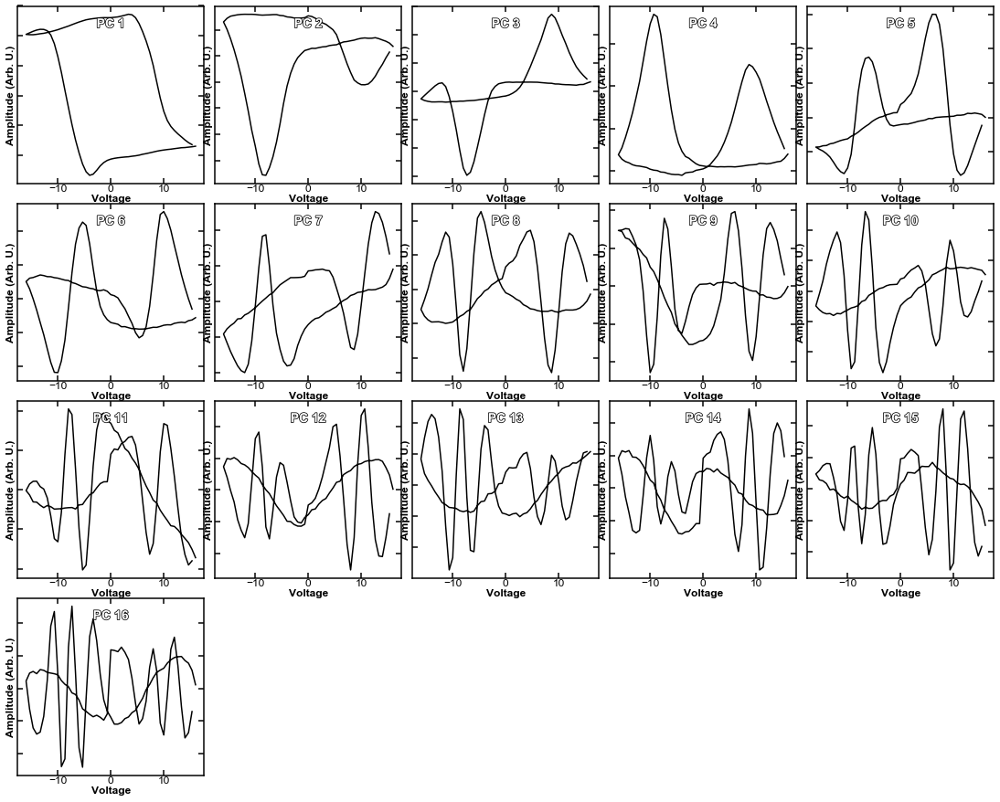

In [8]:
sf.plot_pca_vectors(voltage,
                   PCA_mixed,
                   filename='./PCA_mixed_vectors',
                   print_PNG=True,
                   letter_labels=False)

# Non-Negative Matrix Factorization

In [9]:
model = NMF(n_components=16, init='random', random_state=0)
W = model.fit_transform(np.rollaxis(Piezoresponse - np.min(Piezoresponse),1))
H = np.rollaxis(model.components_,1)

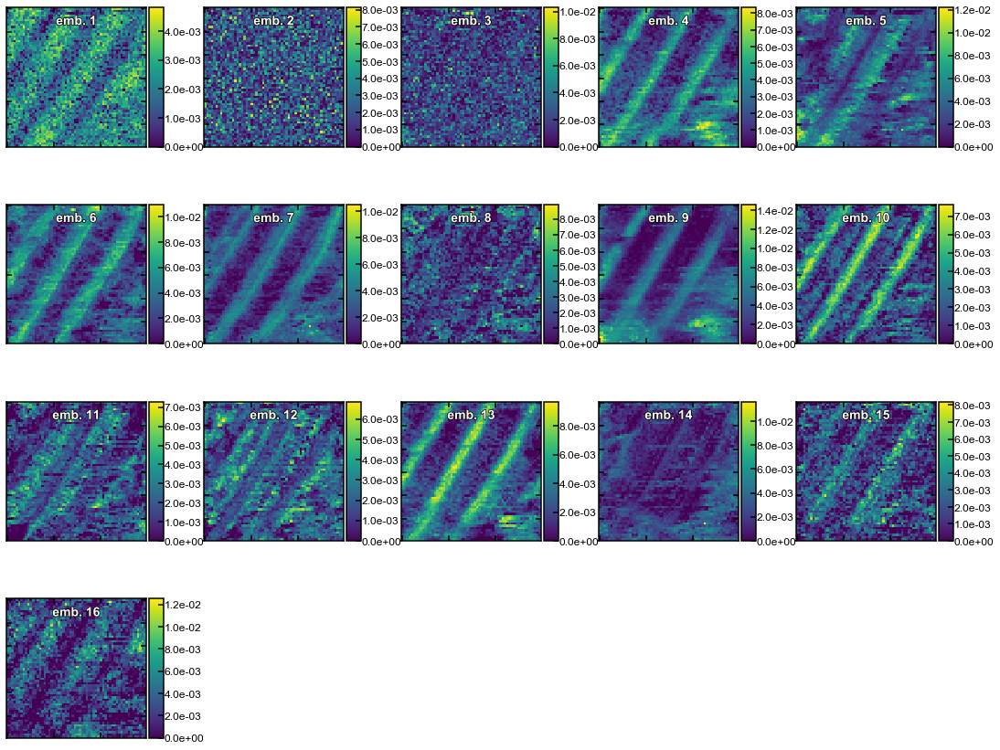

In [10]:
fig = sf.plot_embedding_maps(H)

# Clustering using raw loops

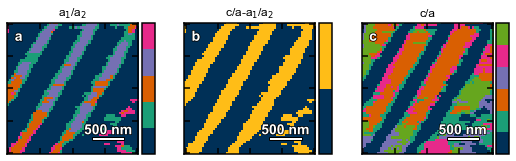

In [11]:
int_cluster = 2
num_c_cluster = 5
num_a_cluster = 4

combined_map_raw, cluster_ca_raw, c_map_raw, a_map_raw = sf.cluster_loops(Piezoresponse, int_cluster, 
                             num_c_cluster, num_a_cluster,
                             seed=42)

names = {('c/a-a${_1}$/a${_2}$','cluster_ca'),
         ('a${_1}$/a${_2}$','a_map'),('c/a','c_map')} 

sf.plot_hierachical_cluster_maps(cluster_ca_raw, c_map_raw, a_map_raw, names)

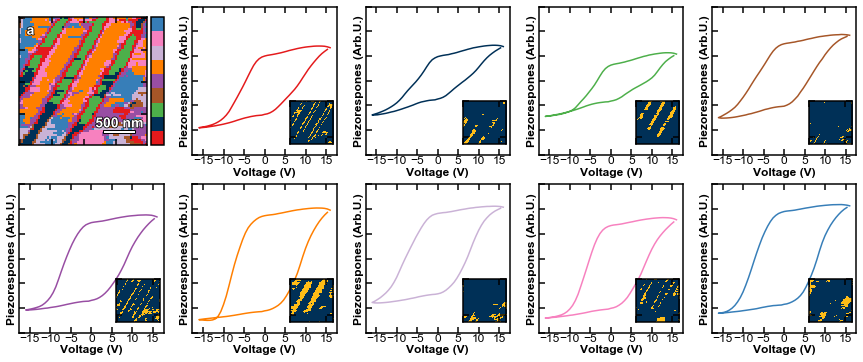

In [12]:
sf.plot_clustered_hysteresis(voltage, Piezoresponse, combined_map_raw)

# Clustering PCA

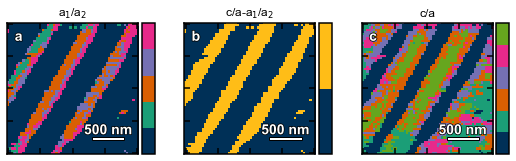

In [13]:
int_cluster = 2
num_c_cluster = 5
num_a_cluster = 4

PCA_out = sf.pca_weights_as_embeddings(PCA_mixed, Piezoresponse)

combined_map_PCA, cluster_ca_PCA, c_map_PCA, a_map_PCA = sf.cluster_loops(PCA_out, int_cluster, 
                             num_c_cluster, num_a_cluster,
                             seed=48)

names = {('c/a-a${_1}$/a${_2}$','cluster_ca'),
         ('a${_1}$/a${_2}$','a_map'),('c/a','c_map')} 

sf.plot_hierachical_cluster_maps(cluster_ca_PCA, c_map_PCA, a_map_PCA, names)

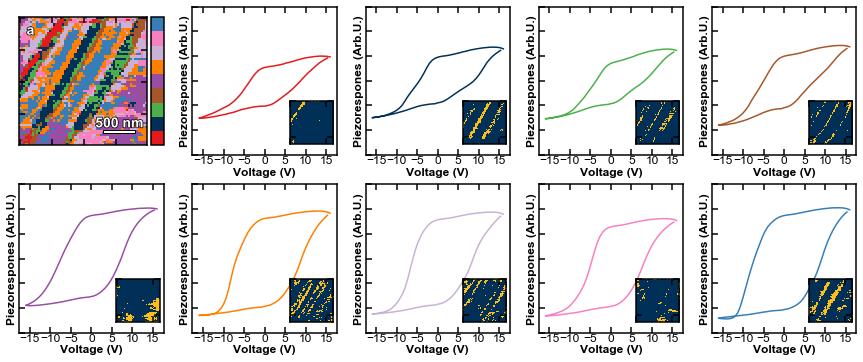

In [14]:
sf.plot_clustered_hysteresis(voltage, Piezoresponse, combined_map_PCA)
sf.savefig('PCA_Cluster',print_EPS=True)

## Clustering Non-Negative Matrix Factorization

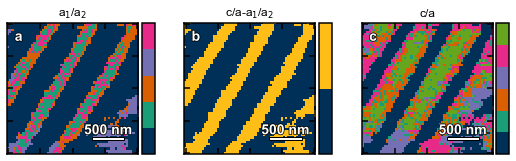

In [15]:
int_cluster = 2
num_c_cluster = 5
num_a_cluster = 4

combined_map_NMF, cluster_ca_NMF, c_map_NMF, a_map_NMF = sf.cluster_loops(H, int_cluster, 
                             num_c_cluster, num_a_cluster,
                             seed=48)

names = {('c/a-a${_1}$/a${_2}$','cluster_ca'),
         ('a${_1}$/a${_2}$','a_map'),('c/a','c_map')} 

sf.plot_hierachical_cluster_maps(cluster_ca_NMF, c_map_NMF, a_map_NMF, names)

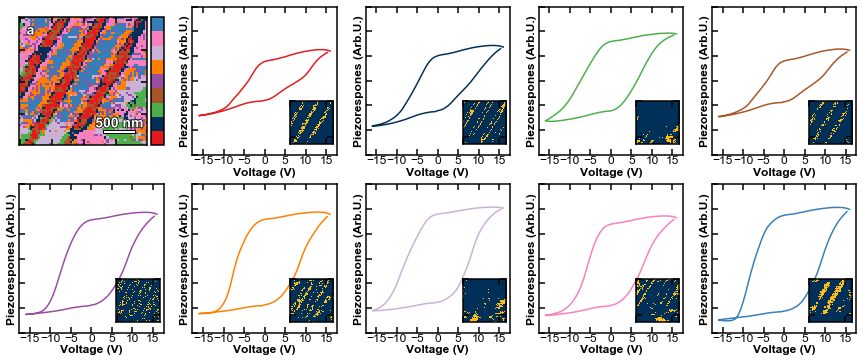

In [16]:
sf.plot_clustered_hysteresis(voltage, Piezoresponse, combined_map_NMF)

# Make Movies of Embeddings

### Generates images

In [17]:
folder = './64x3_16_64x3_10e6_V1/'

sf.export_images_of_embeddings(Piezoresponse, folder, repeat=False)

### Exports Movies

In [177]:
sf.make_movies_from_images(folder, 'embedding_movie')

[MoviePy] >>>> Building video Movie1_caca_BEPS1.webm
[MoviePy] Writing video Movie1_caca_BEPS1.webm


  1%|          | 1/160 [00:00<00:53,  2.99it/s]


OSError: [Errno 32] Broken pipe

MoviePy error: FFMPEG encountered the following error while writing file Movie1_caca_BEPS1.webm:

 b"Unknown encoder 'libvpx'\n"

The video export failed because FFMPEG didn't find the specified codec for video encoding (libvpx). Please install this codec or change the codec when calling write_videofile. For instance:
  >>> clip.write_videofile('myvid.webm', codec='libvpx')

# Autoencoder Analysis

In [18]:
import keras
from keras.models import Sequential, Input, Model
from keras.layers import (Dense, Conv1D, Convolution2D, GRU, LSTM, Recurrent, Bidirectional, TimeDistributed,
                          Dropout, Flatten, RepeatVector, Reshape, MaxPooling1D, UpSampling1D, BatchNormalization)
from keras.layers.core import Lambda
from keras.optimizers import Adam

In [19]:
# loads the model
model = keras.models.load_model('download_end')

#Use if loading embeddings from file
embeddings = sf.get_activations('download_out.npy')

model download_out.npy loaded from saved file


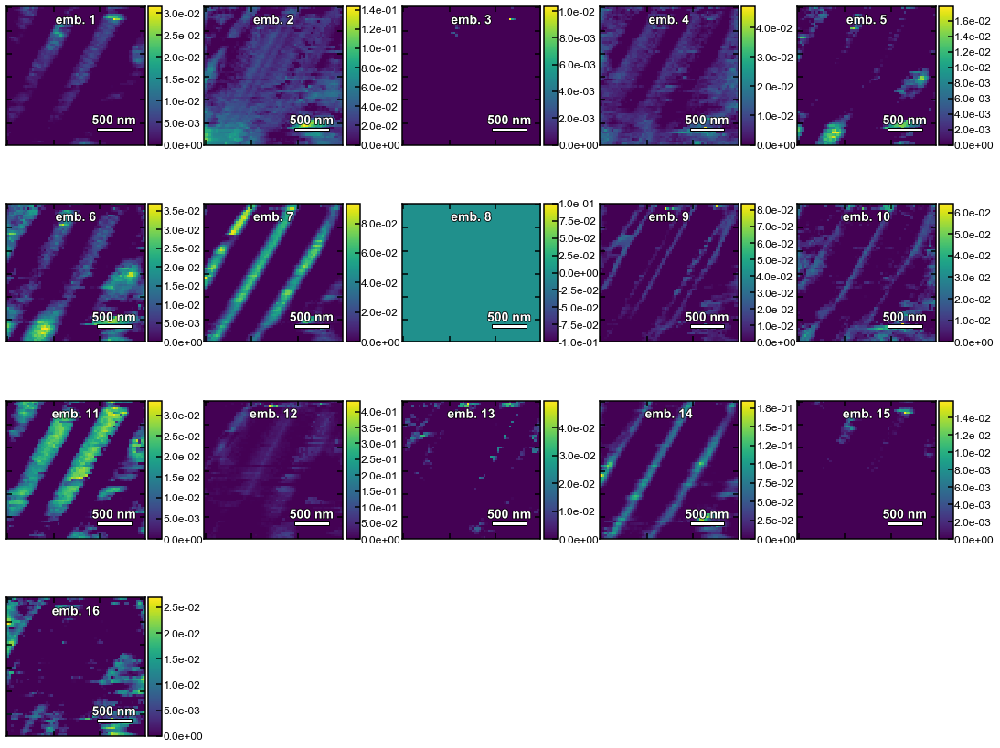

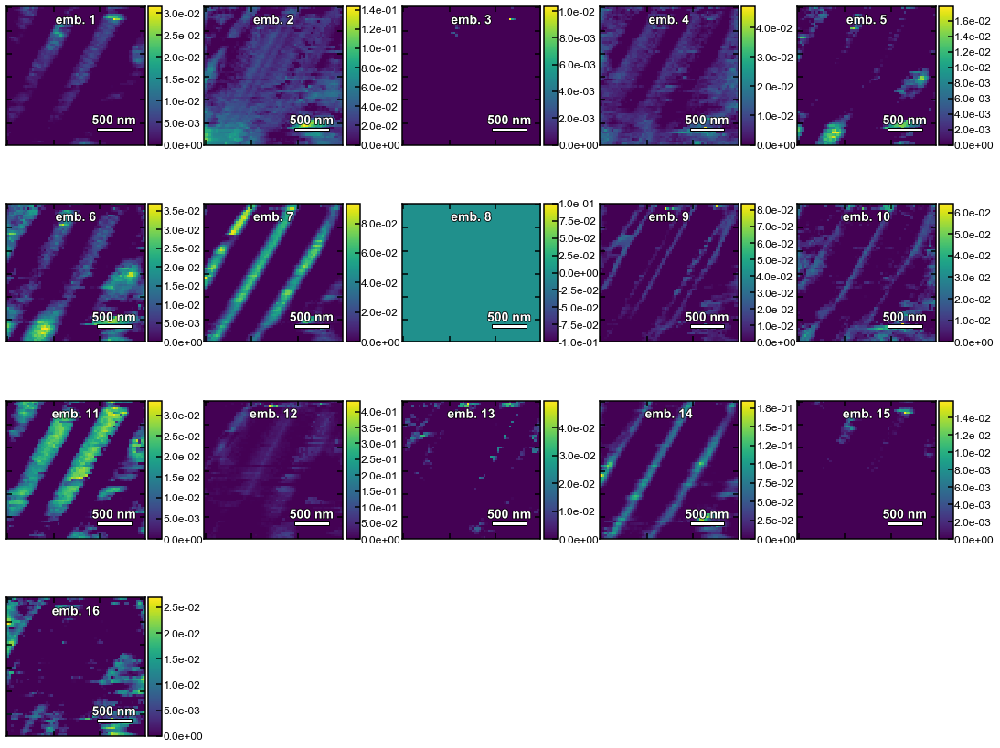

In [19]:
sf.plot_embedding_maps(embeddings,add_scalebar=[2000,500],print_EPS=True, filename='./embedding')

In [20]:
PE_scaled = Piezoresponse
PE_scaled -= np.mean(PE_scaled.reshape(-1))
PE_scaled /= np.std(PE_scaled)
PE_scaled = np.atleast_3d(PE_scaled)

# builds the identical encoding model
model_decode = Sequential()
model_decode.add(RepeatVector(96,input_shape=(16,)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(TimeDistributed(Dense(1, activation='linear')))

# Sets the layers to match the training model
model_decode.layers[1].set_weights((model.layers[7].get_weights()))
model_decode.layers[2].set_weights((model.layers[8].get_weights()))
model_decode.layers[3].set_weights((model.layers[9].get_weights()))
model_decode.layers[4].set_weights((model.layers[10].get_weights()))
model_decode.layers[5].set_weights((model.layers[11].get_weights()))
model_decode.layers[6].set_weights((model.layers[12].get_weights()))

model.compile(Adam(3e-5), loss='mse')

In [21]:
a_average = np.average(PE_scaled[np.where(cluster_ca_raw == 1)],axis=0).squeeze()
c_average = np.average(PE_scaled[np.where(cluster_ca_raw == 0)],axis=0).squeeze()

# Makes Generative Maps for the Piezoresponse

In [34]:
graph = 16
mod = 4

# Defines the colorlist
cmap = plt.get_cmap('viridis')

number = 200

# defines the ranges
ranges = [0.01,0.1,0,0.02,.015,0.035,.09,0,0.025,.03,.03,.1,.035,.12,.009,.02]


ave_embed = np.zeros((16))

# Makes folder
folder = sf.Make_folder('Generated_Loops')

for j in range(number):
    fig, ax = plt.subplots(graph // mod + (graph % mod > 0), mod,
                         figsize=(3 * mod, 3 * (graph // mod + (graph % mod > 0))))
    ax = ax.reshape(-1)
    
    for i in range(16):
        values = np.repeat(ave_embed,number).reshape(16,number).T
        values[:,i] = np.linspace(0,ranges[i],number)
        generated = model_decode.predict(np.atleast_2d(values)).squeeze()
        ax[i].plot(voltage, generated[j,:], color = cmap((j+1)/number))
        ax[i].set_ylim(-1.5,1.5)
        ax[i].set_yticklabels('')
        #plt.close(fig)
        ax[i].plot(voltage, generated[0,:], color = cmap((0+1)/number))
        
        pos = ax[i].get_position()
        # plots and formats the binary cluster map
        axes_in = plt.axes([pos.x0+.107, pos.y0,.06, .06])
        axes_in.imshow(embeddings[:, i].reshape(60, 60), clim=[0,ranges[i]])
        axes_in.set_yticklabels('')
        axes_in.set_xticklabels('')
    print(j)
    sf.savefig(pjoin(folder,f'{j:04d}_maps'),print_PNG=True)
    plt.close(fig)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199


In [36]:
import glob
import os
import moviepy.editor as mpy

gif_name = 'switching movie'
file_list = glob.glob('./Generated_Loops/*.png') # Get all the pngs in the current directory
list.sort(file_list) # Sort the images by #, this may need to be tweaked for your use case
file_list_rev = glob.glob('./Generated_Loops/*.png')
list.sort(file_list_rev,reverse=True)
new_list = file_list + file_list_rev
fps = 16
clip = mpy.ImageSequenceClip(new_list, fps=fps)
clip.write_gif('{}.gif'.format(gif_name), fps=fps)


[MoviePy] Building file switching movie.gif with imageio


100%|█████████▉| 400/401 [06:53<00:00,  1.02it/s]


# Makes Generative Maps for the Resonance

In [52]:
model = keras.models.load_model('end_full_model2.hdf5')

In [ ]:
out_data = sf.get_activations(model, np.atleast_3d(data),2)

In [ ]:
graph = 16
mod = 4

# Defines the colorlist
cmap = plt.get_cmap('viridis')

number = 10

# defines the ranges
ranges = [0.01,0.1,0,0.02,.015,0.035,.09,0,0.025,.03,.03,.1,.035,.12,.009,.02]


ave_embed = np.zeros((16))

# Makes folder
folder = sf.Make_folder('Generated_Loops_Resonance')

for j in range(number):
    fig, ax = plt.subplots(graph // mod + (graph % mod > 0), mod,
                         figsize=(3 * mod, 3 * (graph // mod + (graph % mod > 0))))
    ax = ax.reshape(-1)
    
    for i in range(16):
        ave_embed = np.mean(embeddings[np.where(embeddings[:, i]>0)],axis=0)
        values = np.repeat(ave_embed,number).reshape(16,number).T
        values[:,i] = np.linspace(0,ranges[i],number)
        generated = model.predict(np.atleast_2d(values)).squeeze()
        ax[i].plot(voltage, generated[j,:], color = cmap((j+1)/number))
        ax[i].set_ylim(-2,2)
        ax[i].set_yticklabels('')
        #plt.close(fig)
        ax[i].plot(voltage, generated[0,:], color = cmap((0+1)/number))
        
        pos = ax[i].get_position()
        # plots and formats the binary cluster map
        axes_in = plt.axes([pos.x0+.107, pos.y0,.06, .06])
        axes_in.imshow(embeddings[:, i].reshape(60, 60), clim=[0,ranges[i]])
        axes_in.set_yticklabels('')
        axes_in.set_xticklabels('')
    print(j)
    sf.savefig(pjoin(folder,f'{j:04d}_maps'),print_PNG=True)
    plt.close(fig)

In [42]:
np.where(embeddings[:, i]>0)

(array([   5,    6,    7, ..., 3580, 3581, 3582]),)

In [ ]:
plt.plot(voltage, )

In [44]:
values

array([[3.7912840e-03, 1.8797785e-02, 3.5125722e-05, 5.5580870e-03,
        9.4451016e-04, 6.8935035e-03, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 1.8970680e-03, 1.7953105e-02, 6.6860253e-03,
        1.0601940e-03, 0.0000000e+00, 3.6730742e-04, 8.2543632e-04]],
      dtype=float32)

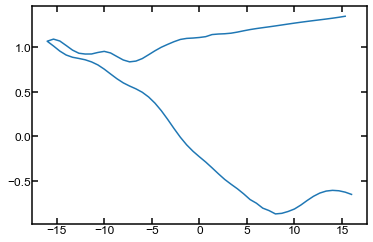

In [47]:
number = 1
i = 3



ave_embed = np.mean(embeddings[:],axis=0)
values = np.repeat(ave_embed,number).reshape(16,number).T
plt.plot(voltage,model.predict(values).squeeze())

/Users/joshuaagar/anaconda/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/joshuaagar/anaconda/lib/python3.6/site-packages/numpy/core/_methods.py:73: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


0
1
2
3
4
5
6
7
8
9


In [48]:
graph = 16
mod = 4

# Defines the colorlist
cmap = plt.get_cmap('viridis')

number = 100

# defines the ranges
ranges = [0.01,0.1,0,0.02,.015,0.035,.09,0,0.025,.03,.03,.1,.035,.12,.009,.02]


ave_embed = np.zeros((16))

# Makes folder
folder = sf.Make_folder('Generated_Loops_Resonance')

for j in range(number):
    fig, ax = plt.subplots(graph // mod + (graph % mod > 0), mod,
                         figsize=(3 * mod, 3 * (graph // mod + (graph % mod > 0))))
    ax = ax.reshape(-1)
    
    for i in range(16):
        values = np.repeat(ave_embed,number).reshape(16,number).T
        values[:,i] = np.linspace(0,ranges[i],number)
        generated = model.predict(np.atleast_2d(values)).squeeze()
        ax[i].plot(voltage, generated[j,:], color = cmap((j+1)/number))
        ax[i].set_ylim(-2,2)
        ax[i].set_yticklabels('')
        #plt.close(fig)
        ax[i].plot(voltage, generated[0,:], color = cmap((0+1)/number))
        
        pos = ax[i].get_position()
        # plots and formats the binary cluster map
        axes_in = plt.axes([pos.x0+.107, pos.y0,.06, .06])
        axes_in.imshow(embeddings[:, i].reshape(60, 60), clim=[0,ranges[i]])
        axes_in.set_yticklabels('')
        axes_in.set_xticklabels('')
    print(j)
    sf.savefig(pjoin(folder,f'{j:04d}_maps'),print_PNG=True)
    plt.close(fig)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


In [36]:
import glob
import os
import moviepy.editor as mpy

gif_name = 'switching movie'
file_list = glob.glob('./Generated_Loops/*.png') # Get all the pngs in the current directory
list.sort(file_list) # Sort the images by #, this may need to be tweaked for your use case
file_list_rev = glob.glob('./Generated_Loops/*.png')
list.sort(file_list_rev,reverse=True)
new_list = file_list + file_list_rev
fps = 16
clip = mpy.ImageSequenceClip(new_list, fps=fps)
clip.write_gif('{}.gif'.format(gif_name), fps=fps)


[MoviePy] Building file switching movie.gif with imageio


100%|█████████▉| 400/401 [06:53<00:00,  1.02it/s]


In [9]:
model = keras.models.load_model('Amplitude_model.hdf5')

In [10]:
def clean_and_interpolate(data):
    data[~np.isfinite(data)]=np.nan
    data = sf.interpolate_missing_points(data).reshape(-1,data.shape[2])
    return data

In [11]:
def PCA_reconstruction(data, components):

    # Sets the number of components to save
    pca = decomposition.PCA(n_components=components)

    # Computes the PCA of the piezoelectric hysteresis loops
    PCA_data = pca.fit(data)

    # does the inverse transform - creates a low rank representation of the data
    PCA_reconstructed_data = pca.inverse_transform(
        pca.transform(data))
    return PCA_reconstructed_data

In [12]:
# loads the data file
data = io.matlab.loadmat('./Data.mat')

# extracts the voltage vector
voltage = data['Voltagedata_mixed']

# extracts the hyteresis loops
Piezoresponse = data['Loopdata_mixed']
Amplitude = data['OutA2_mixed']
Phase = data['OutPhi1_mixed']
Resonance = data['Outw2_mixed']
Quality = data['OutQ2_mixed']

# interpolates missing points
Piezoresponse = sf.interpolate_missing_points(Piezoresponse).reshape(-1,Piezoresponse.shape[2])
Amplitude = clean_and_interpolate(Amplitude)
Phase = clean_and_interpolate(Phase)
#
#for i in range(60):
#    for j in range(60):
#        low = Resonance[i,j] < np.mean(Resonance[i,j]) - 2*np.std(Resonance[i,j])
#        high =Resonance[i,j] > #
#        outliers = np.where(low + high)
#        Resonance[i,j,outliers] = np.nan
Resonance = clean_and_interpolate(Resonance)
Quality = clean_and_interpolate(Quality)

In [16]:
Amp_PCA = PCA_reconstruction(Amplitude, 35) 
Amp_PCA -= np.mean(Amp_PCA)
Amp_PCA /= np.std(Amp_PCA)

embeddings = sf.get_activations('download_out.npy')

model download_out.npy loaded from saved file


In [36]:
#Note it looks like this network could use some improvement. 
#The loss is still a bit too high. Should train this network longer

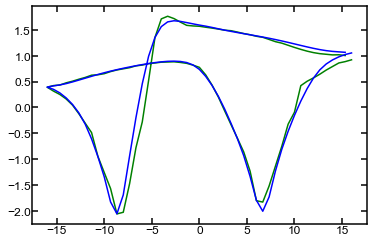

In [35]:
i = np.random.randint(0,3600)

prediction = model.predict(np.atleast_2d(embeddings[i,:]))

plt.plot(voltage, Amp_PCA[i], 'g')
plt.plot(voltage, prediction.squeeze(), 'b')



In [47]:
graph = 16
mod = 4

# Defines the colorlist
cmap = plt.get_cmap('viridis')

number = 200

# defines the ranges
ranges = [0.01,0.1,0,0.02,.015,0.035,.09,0,0.025,.03,.03,.1,.035,.12,.009,.02]

# sets the average to the all zero vector
ave_embed = np.zeros((16))

# Makes folder
folder = sf.Make_folder('Generated_Loops_Amp')

for j in range(number):
    fig, ax = plt.subplots(graph // mod + (graph % mod > 0), mod,
                         figsize=(3 * mod, 3 * (graph // mod + (graph % mod > 0))))
    ax = ax.reshape(-1)
    
    for i in range(16):
        values = np.repeat(ave_embed,number).reshape(16,number).T
        values[:,i] = np.linspace(0,ranges[i],number)
        generated = model.predict(np.atleast_2d(values)).squeeze()
        ax[i].plot(voltage, generated[j,:], color = cmap((j+1)/number))
        ax[i].set_ylim(-3.5,3.5)
        ax[i].set_yticklabels('')
        #plt.close(fig)
        ax[i].plot(voltage, generated[0,:], color = cmap((0+1)/number))
        
        pos = ax[i].get_position()
        # plots and formats the binary cluster map
        axes_in = plt.axes([pos.x0, pos.y0+.103,.06, .06])
        axes_in.imshow(embeddings[:, i].reshape(60, 60), clim=[0,ranges[i]])
        axes_in.set_yticklabels('')
        axes_in.set_xticklabels('')
    print(j)
    sf.savefig(pjoin(folder,f'{j:04d}_maps'),print_PNG=True)
    plt.close(fig)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199


In [39]:
generated.shape

(96,)

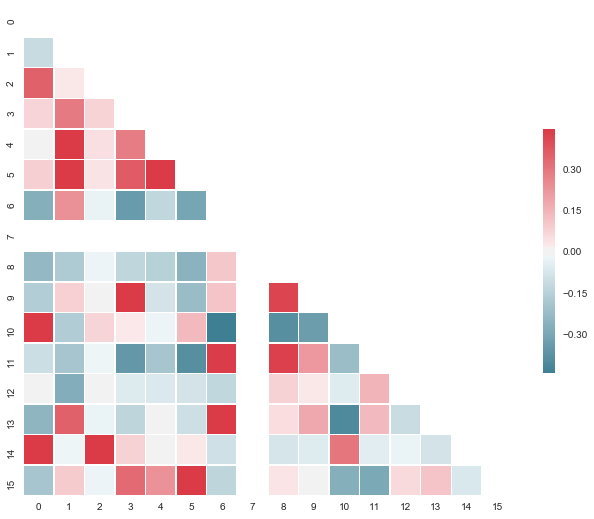

In [62]:
from string import ascii_letters
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="white")

# Generate a large random dataset

d = pd.DataFrame(data=embeddings)

# Compute the correlation matrix
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [ ]:
for i in range(16):
    for j in range(16)

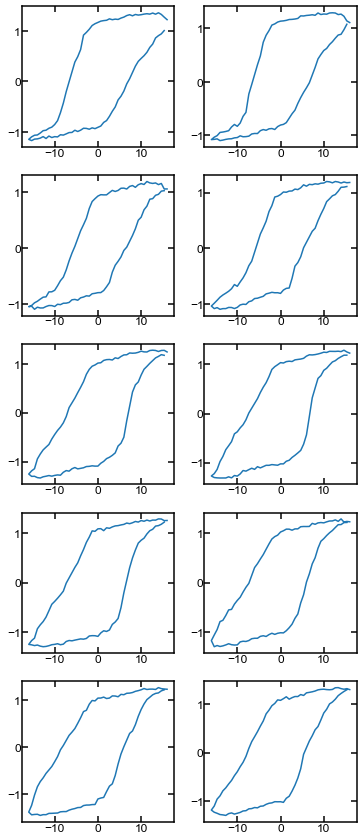

In [74]:
graph = 10
mod = 2

fig, ax = plt.subplots(graph // mod + (graph % mod > 0), mod,
                 figsize=(3 * mod, 3 * (graph // mod + (graph % mod > 0))))

for i in range(10):

    ax = ax.reshape(-1)
    ax[i].plot(voltage,PE[48,40+i,:])

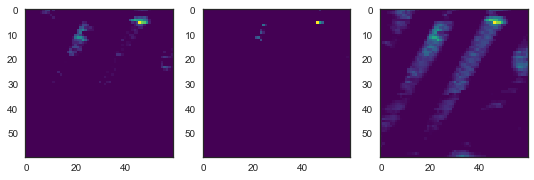

In [67]:
fig, ax = sf.layout_graphs_of_arb_number(3)

for i, value in enumerate([14,2,0]):
    ax[i].imshow(embeddings[:,value].reshape(60,60),cmap='viridis')

In [76]:
embedding_normalized = embeddings

for i in range(15):
    inds = np.where(embeddings[:,i]!=0)
    embedding_normalized[inds,i] -= np.mean(embeddings[inds,i])
    embedding_normalized[inds,i] /= np.std(embedding_normalized[inds,i])

In [101]:
from pydoc import help
from scipy.stats.stats import pearsonr

corr = np.zeros((3600,16,16))
for i in range(16):
    for j in range(16):
        inds = np.where((embedding_normalized[:,i]!=0) & (embedding_normalized[:,j]!=0))
        inds = np.asarray(inds).squeeze()
        print(inds.size)
        corr[:,i,j] = embedding_normalized[:,i] - embedding_normalized[:,j]
        
        
        
        #if inds.size>50:
        #    corr[i,j] = pearsonr(embedding_normalized[inds,i][0],embedding_normalized[inds,j][0])
        #    #corr[i,j] = np.corrcoef(np.stack([embedding_normalized[inds,i][0],embedding_normalized[inds,j][0]]))
        #else:
        #    corr[i,j] = 0

1098
962
17
1065
321
909
0
0
0
303
1096
586
113
0
192
213
962
3196
17
2456
624
1783
1553
0
1119
1439
1422
1740
0
1444
181
1026
17
17
17
17
15
16
0
0
0
7
17
3
0
0
14
2
1065
2456
17
2778
656
1859
882
0
819
1402
1589
1243
257
891
182
1127
321
624
15
656
671
671
111
0
82
189
438
5
38
211
80
462
909
1783
16
1859
671
1931
423
0
365
636
1259
472
124
545
176
1070
0
1553
0
882
111
423
1609
0
1048
989
40
1057
29
1348
0
483
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1119
0
819
82
365
1048
0
1266
915
0
782
101
998
0
460
303
1439
7
1402
189
636
989
0
915
1709
508
1050
205
957
45
583
1096
1422
17
1589
438
1259
40
0
0
508
1653
863
193
1
192
440
586
1740
3
1243
5
472
1057
0
782
1050
863
1993
194
843
96
11
113
0
0
257
38
124
29
0
101
205
193
194
318
52
10
127
0
1444
0
891
211
545
1348
0
998
957
1
843
52
1521
0
619
192
181
14
182
80
176
0
0
0
45
192
96
10
0
192
24
213
1026
2
1127
462
1070
483
0
460
583
440
11
127
619
24
1180


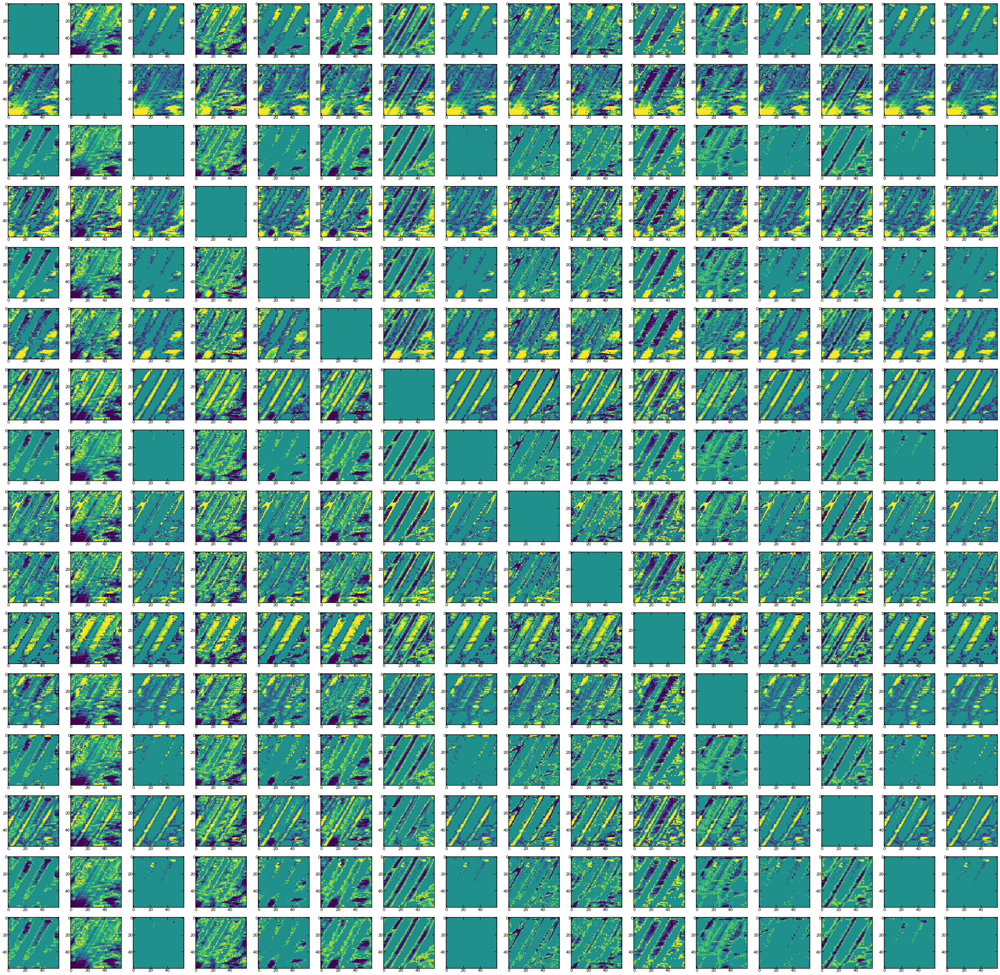

In [106]:
graph = 16*16
mod = 16

fig, ax = plt.subplots(graph // mod + (graph % mod > 0), mod,
                     figsize=(3 * mod, 3 * (graph // mod + (graph % mod > 0))))
#ax = ax.reshape(-1)

for i in range(16):
    for j in range(16):
        ax[i,j].imshow(corr[:,i,j].reshape(60,60),clim=[-1.5,1.5])

In [98]:
embedding_normalized[:,i].shape

(3600,)

In [180]:
inds.size

1

/Users/joshuaagar/anaconda/lib/python3.6/site-packages/numpy/lib/function_base.py:1110: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/Users/joshuaagar/anaconda/lib/python3.6/site-packages/numpy/core/_methods.py:73: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


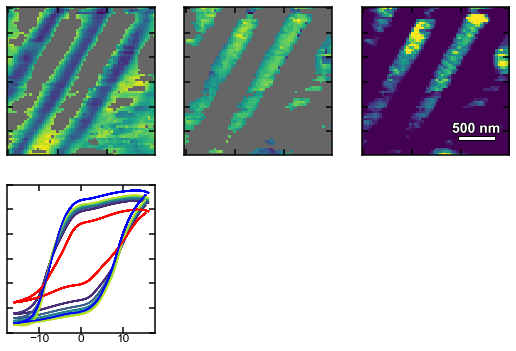

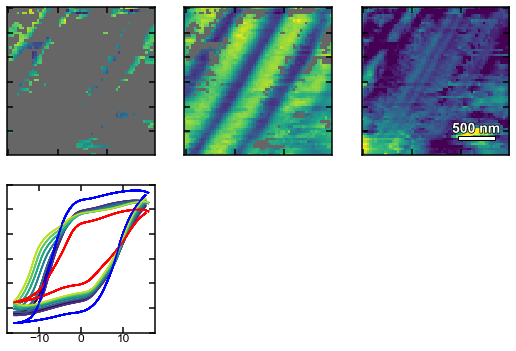

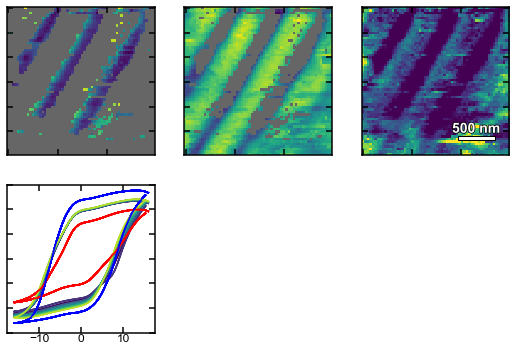

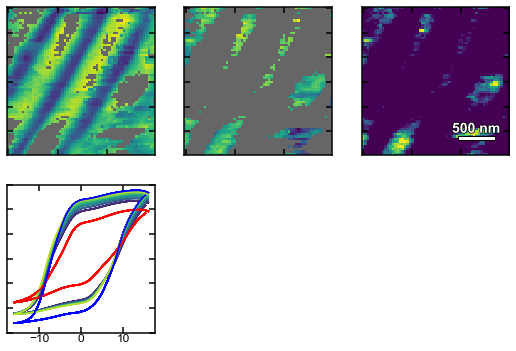

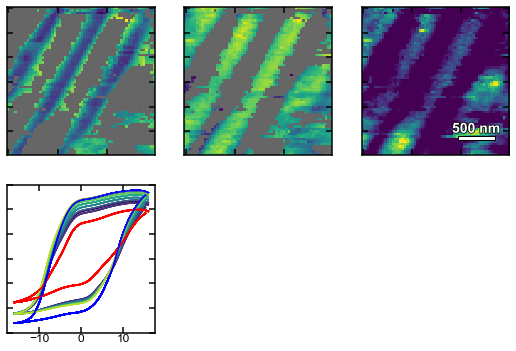

...

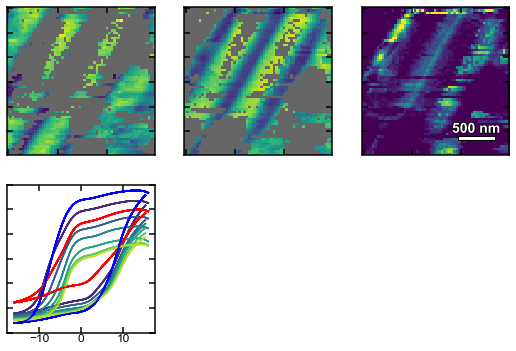

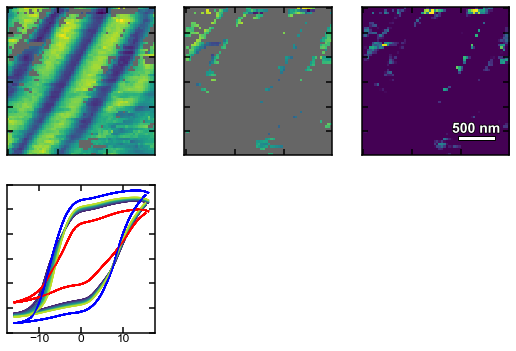

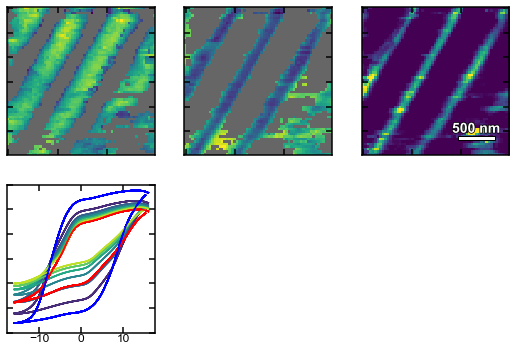

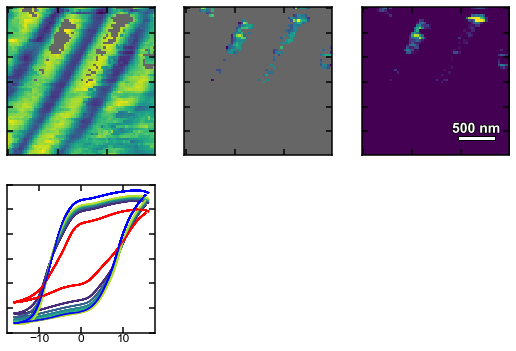

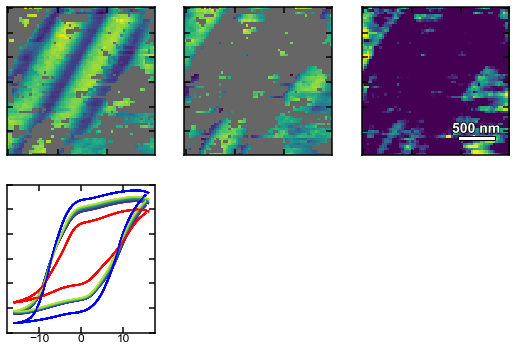

In [53]:
# defines the ranges
ranges = [0.01,0.1,0,0.02,.015,0.035,.09,0,0.025,.03,.03,.1,.035,.12,.009,.02]

# computes the average piezoresponse Loop
#ave_PE = c_average #np.average(PE_scaled.squeeze(), axis=0)

# computes the embedding for the average piezoelectric hysteresis loop
#ave_embed = sf.get_ith_layer_output(model,np.atleast_3d(ave_PE), 5)
ave_embed = np.zeros((16))

# Defines the colorlist
cmap = plt.get_cmap('viridis')

for i in range(embeddings.shape[1]):
    
    if np.sum(embeddings[:, i] > 0) > 100:
        # Builds the graph structure
        fig, ax = sf.layout_graphs_of_arb_number(4)

        # shows the regions activated
        dat_hold = np.copy(data['Acosarea_mixed']).reshape(-1)
        dat_hold[np.where(embeddings[:, i] > 0)] = np.nan

        # plots the region activated
        im = ax[0].imshow(dat_hold.reshape(60, 60))
        ax[0].set_yticklabels('')
        ax[0].set_xticklabels('')
        ax[0].set_facecolor((.4, .4, .4))

        # shows the regions activated
        dat_hold = np.copy(data['Acosarea_mixed']).reshape(-1)
        dat_hold[np.where(embeddings[:, i] == 0)] = np.nan

        # plots the region activated
        im = ax[1].imshow(dat_hold.reshape(60, 60))
        ax[1].set_yticklabels('')
        ax[1].set_xticklabels('')
        ax[1].set_facecolor((.4, .4, .4))

        # plots the activation map
        ax[2].imshow(embeddings[:, i].reshape(60, 60), clim=[0,ranges[i]])
        ax[2].set_yticklabels('')
        ax[2].set_xticklabels('')
        sf.add_scalebar_to_figure(ax[2], 2000, 500)
        
        hist, bins = np.histogram(embeddings[:, i], 6)

        for k in range(5):
            idx = np.where((embeddings[:, i] > bins[k]) * (embeddings[:, i] < bins[k + 1]))

            PE_ave_loc = np.average(np.atleast_2d(Piezoresponse[idx].squeeze()),axis=0)
            if len(idx[0])>1:
                values = np.repeat(ave_embed,7).reshape(16,7).T
                values[1::,i] = np.linspace(0,np.max(embeddings[:,i]),6)
                generated = model_decode.predict(np.atleast_2d(values)).squeeze()
                for j in range(7):
                    ax[3].plot(voltage, generated[j,:], color = cmap(.15*j))
                    ax[3].plot(voltage,a_average, 'r')
                    ax[3].plot(voltage,c_average, 'b')
                    ax[3].set_ylim(-1.5,1.5)
                    ax[3].set_yticklabels('')
                    
                    
        sf.savefig(f'embedding_Maps_{i}',print_EPS=True, print_PNG=True)

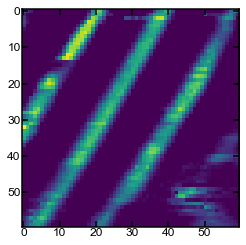

In [12]:
plt.imshow(embeddings[:, 6].reshape(60,60))

In [13]:
# defines the ranges
ranges = [0.01,0.1,0,0.02,.015,0.035,.09,0,0.025,.03,.03,.1,.035,.12,.009,.02]

# computes the average piezoresponse Loop
#ave_PE = a_average #np.average(PE_scaled.squeeze(), axis=0)

# computes the embedding for the average piezoelectric hysteresis loop
#ave_embed = sf.get_ith_layer_output(model,np.atleast_3d(ave_PE), 5)
ave_embed = np.zeros((16))

number = 200

i = 6

for j in range(number):
    fig, ax = sf.layout_graphs_of_arb_number(1)
    values = np.repeat(ave_embed,number).reshape(16,number).T
    values[:,i] = np.linspace(0,np.max(embeddings[:,i]),number)
    generated = model_decode.predict(np.atleast_2d(values)).squeeze()
    ax[0].plot(voltage, generated[j,:], color = cmap((j+1)/number))
    ax[0].set_ylim(-1.5,1.5)
    ax[0].set_yticklabels('')
    ax[0].set_ylabel('Piezorespones (Arb.U.)')
    ax[0].set_xlabel('Voltage (V)')
    sf.savefig(f'./a_domain/Zero_{j:04d}_piezoresponseloop',print_PNG=True)
    plt.close(fig)

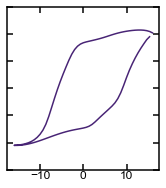

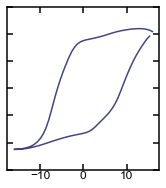

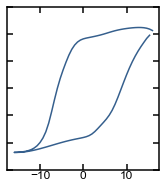

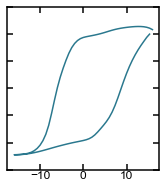

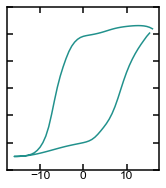

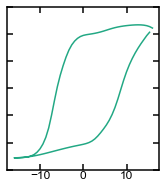

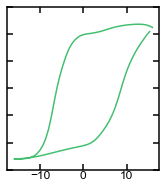

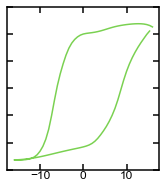

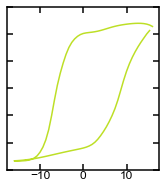

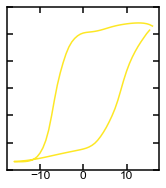

In [10]:
# Defines the colorlist
cmap = plt.get_cmap('viridis')

number = 10

i = 0

ave_embed = np.zeros((16))

for j in range(number):
    fig, ax = sf.layout_graphs_of_arb_number(1)
    values = np.repeat(ave_embed,number).reshape(16,number).T
    values[:,i] = np.linspace(0,np.max(embeddings[:,i]),number)
    generated = model_decode.predict(np.atleast_2d(values)).squeeze()
    ax[0].plot(voltage, generated[j,:], color = cmap((j+1)/number))
    ax[0].set_ylim(-1.5,1.5)
    ax[0].set_yticklabels('')
    #plt.close(fig)

In [38]:
import glob
import os
import moviepy.editor as mpy

gif_name = 'c_domain_movie'
file_list = glob.glob('./c_domain/Zero_*.png') # Get all the pngs in the current directory
list.sort(file_list) # Sort the images by #, this may need to be tweaked for your use case
file_list_rev = glob.glob('./c_domain/Zero_*.png')
list.sort(file_list_rev,reverse=True)
new_list = file_list + file_list_rev
fps = 16
clip = mpy.ImageSequenceClip(new_list, fps=fps)
clip.write_gif('{}.gif'.format(gif_name), fps=fps)


[MoviePy] Building file c_domain_movie.gif with imageio



 84%|████████▍ | 337/401 [00:37<00:06,  9.26it/s]


100%|█████████▉| 400/401 [00:44<00:00,  8.46it/s]


In [34]:
new_list

['./a_domain/Zero_0000_piezoresponseloop.png',
 './a_domain/Zero_0001_piezoresponseloop.png',
 './a_domain/Zero_0002_piezoresponseloop.png',
 './a_domain/Zero_0003_piezoresponseloop.png',
 './a_domain/Zero_0004_piezoresponseloop.png',
 './a_domain/Zero_0005_piezoresponseloop.png',
 './a_domain/Zero_0006_piezoresponseloop.png',
 './a_domain/Zero_0007_piezoresponseloop.png',
 './a_domain/Zero_0008_piezoresponseloop.png',
 './a_domain/Zero_0009_piezoresponseloop.png',
 './a_domain/Zero_0010_piezoresponseloop.png',
 './a_domain/Zero_0011_piezoresponseloop.png',
 './a_domain/Zero_0012_piezoresponseloop.png',
 './a_domain/Zero_0013_piezoresponseloop.png',
 './a_domain/Zero_0014_piezoresponseloop.png',
 './a_domain/Zero_0015_piezoresponseloop.png',
 './a_domain/Zero_0016_piezoresponseloop.png',
 './a_domain/Zero_0017_piezoresponseloop.png',
 './a_domain/Zero_0018_piezoresponseloop.png',
 './a_domain/Zero_0019_piezoresponseloop.png',
 './a_domain/Zero_0020_piezoresponseloop.png',
 './a_domain/

In [16]:
#model_path = './32x5_auto/'

# loads the model
#model = keras.models.load_model(model_path + 'end.hdf5')
model = keras.models.load_model('download_end')

# Use if computing embeddings from model
#embeddings = sf.get_activations(model, Piezoresponse, 5)

#Use if loading embeddings from file
#embeddings = sf.get_activations(model_path +'_out.npy')
embeddings = sf.get_activations('download_out.npy')

model download_out.npy loaded from saved file


In [17]:
embeddings.shape

(3600, 16)

In [23]:
PE_scaled = Piezoresponse
PE_scaled -= np.mean(PE_scaled.reshape(-1))
PE_scaled /= np.std(PE_scaled)
PE_scaled = np.atleast_3d(PE_scaled)

# builds the identical encoding model
model_decode = Sequential()
model_decode.add(RepeatVector(96,input_shape=(16,)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(TimeDistributed(Dense(1, activation='linear')))

# Sets the layers to match the training model
model_decode.layers[1].set_weights((model.layers[7].get_weights()))
model_decode.layers[2].set_weights((model.layers[8].get_weights()))
model_decode.layers[3].set_weights((model.layers[9].get_weights()))
model_decode.layers[4].set_weights((model.layers[10].get_weights()))
model_decode.layers[5].set_weights((model.layers[11].get_weights()))
model_decode.layers[6].set_weights((model.layers[12].get_weights()))

model.compile(Adam(3e-5), loss='mse')

/Users/joshuaagar/anaconda/lib/python3.6/site-packages/numpy/lib/function_base.py:1110: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/Users/joshuaagar/anaconda/lib/python3.6/site-packages/numpy/core/_methods.py:73: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


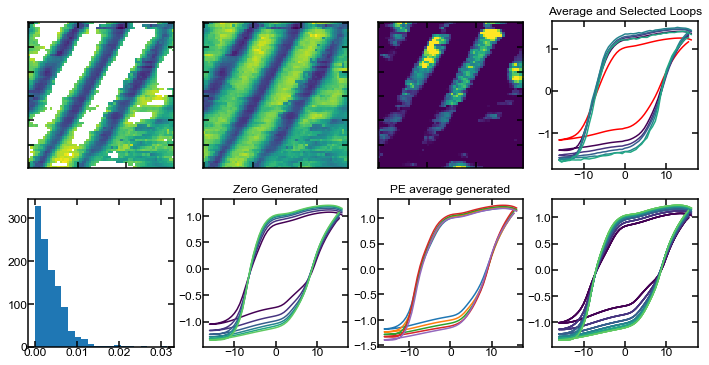

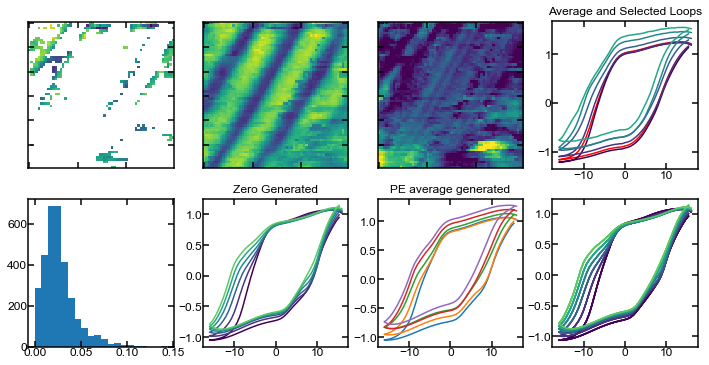

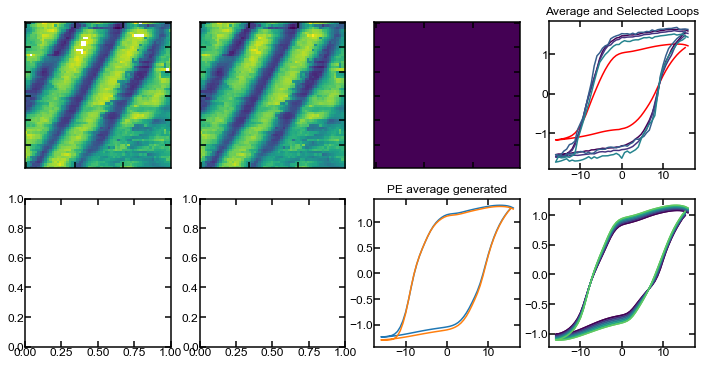

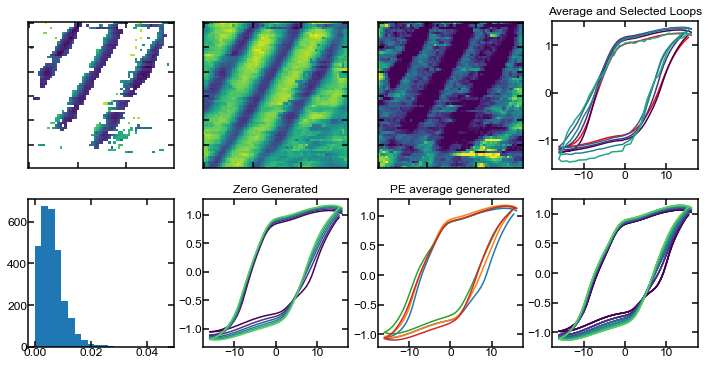

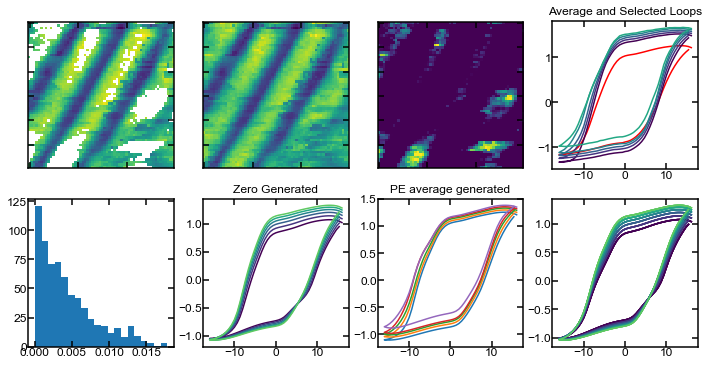

...

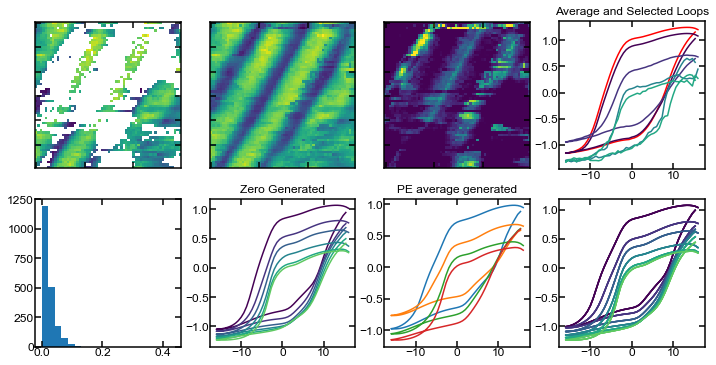

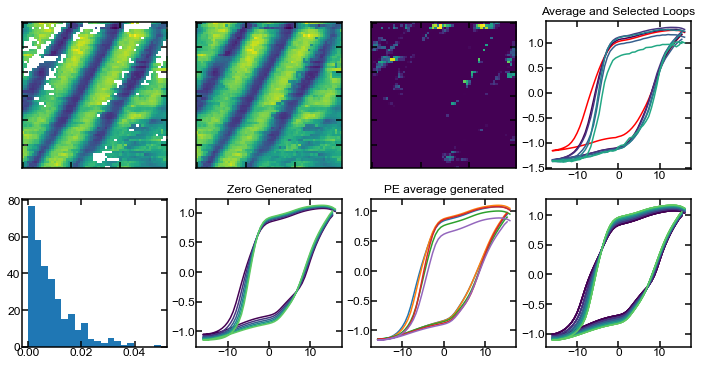

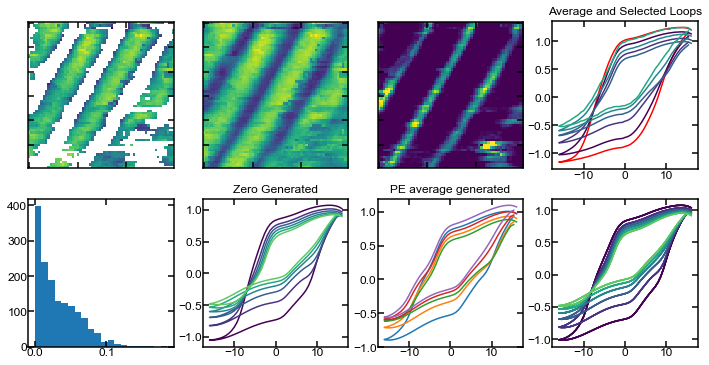

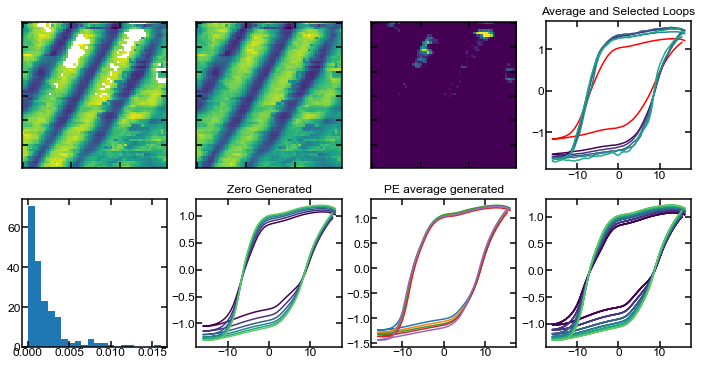

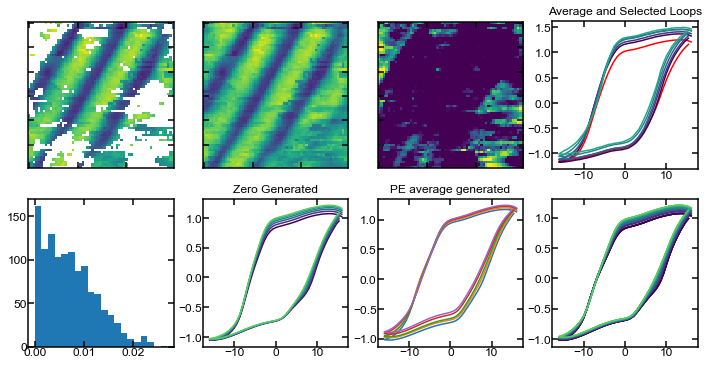

In [45]:
#ranges = [0.01,0.01,0,0.02,0.015,.06,.11,0,.13,.06,.1,.11,.05,.18,0,.1]
ranges = [0.01,0.1,0,0.02,.015,0.035,.05,0,0.025,.03,.03,.1,.035,.12,.009,.02]

ave_PE = np.average(PE_scaled.squeeze(), axis=0)

ave_embed = sf.get_ith_layer_output(model,np.atleast_3d(ave_PE), 5)

for i in range(embeddings.shape[1]):
    
    # Defines the colorlist
    cmap = plt.get_cmap('viridis')

    # Builds the graph structure
    fig, ax = sf.layout_graphs_of_arb_number(8)

    # shows the regions activated
    dat_hold = np.copy(data['Acosarea_mixed']).reshape(-1)
    dat_hold[np.where(embeddings[:, i] > 0)] = np.nan

    # plots the region activated
    im = ax[0].imshow(dat_hold.reshape(60, 60))
    ax[0].set_yticklabels('')
    ax[0].set_xticklabels('')

    # shows the regions activated
    dat_hold = np.copy(data['Acosarea_mixed']).reshape(-1)
    dat_hold[np.where(embeddings[:, i] > 0)] = np.nan

    # plots the region activated
    ax[1].imshow(data['Acosarea_mixed'])
    ax[1].set_yticklabels('')
    ax[1].set_xticklabels('')

    # plots the activation map
    ax[2].imshow(embeddings[:, i].reshape(60, 60), clim=[0,ranges[i]])
    ax[2].set_yticklabels('')
    ax[2].set_xticklabels('')
    

    # Plot the average and selected loops
    ax[3].plot(voltage, np.average(Piezoresponse.squeeze(), axis=0), 'r')
    ax[3].set_title('Average and Selected Loops')
    
    if len(np.where(embeddings[:, i] > 0)[0]) > 20 :
        ax[4].hist(embeddings[np.where(embeddings[:, i] > 0)[0], i], 20)
        
        # all zero except value
        values = np.zeros((6,16))
        values[:,i] = np.linspace(0,np.max(embeddings[:,i]),6)

        generated = model_decode.predict(np.atleast_2d(values)).squeeze()

        for j in range(6):
            ax[5].plot(voltage, generated[j,:], color = cmap(.15*j))
        
        ax[5].set_title('Zero Generated')
    hist, bins = np.histogram(embeddings[:, i], 6)

    for j in range(5):
        idx = np.where((embeddings[:, i] > bins[j]) * (embeddings[:, i] < bins[j + 1]))

        # Plot the average and selected loops
        ax[3].plot(voltage, np.average(np.atleast_2d(
            Piezoresponse[idx].squeeze()), axis=0), color=cmap(.15 * j))
        
        PE_ave_loc = np.average(np.atleast_2d(Piezoresponse[idx].squeeze()),axis=0)
        if len(idx[0])>1:
            generated_pe = model.predict(np.atleast_3d(PE_ave_loc)).squeeze()
            ax[6].plot(voltage, generated_pe)
            ax[6].set_title('PE average generated')
        
            values = np.repeat(ave_embed,6).reshape(16,6).T
            values[:,i] = np.linspace(0,np.max(embeddings[:,i]),6)
            generated = model_decode.predict(np.atleast_2d(values)).squeeze()
            for j in range(6):
                ax[7].plot(voltage, generated[j,:], color = cmap(.15*j))

In [42]:
ranges = [0.01,0.1,0,0.02,.015,0.035,.01,0,0.025,.03,.03,.1,.035,.1,.009,.02]


/Users/joshuaagar/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: Mean of empty slice
/Users/joshuaagar/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:66: RuntimeWarning: Mean of empty slice
/Users/joshuaagar/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:69: RuntimeWarning: Mean of empty slice
/Users/joshuaagar/anaconda/lib/python3.6/site-packages/numpy/lib/function_base.py:1110: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/Users/joshuaagar/anaconda/lib/python3.6/site-packages/numpy/core/_methods.py:73: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/Users/joshuaagar/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:83: RuntimeWarning: Mean of empty slice
/Users/joshuaagar/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:86: RuntimeWarning: Mean of empty slice
/Users/joshuaagar/anaconda/lib/python3.6/site-packages/ipykernel_launcher.p

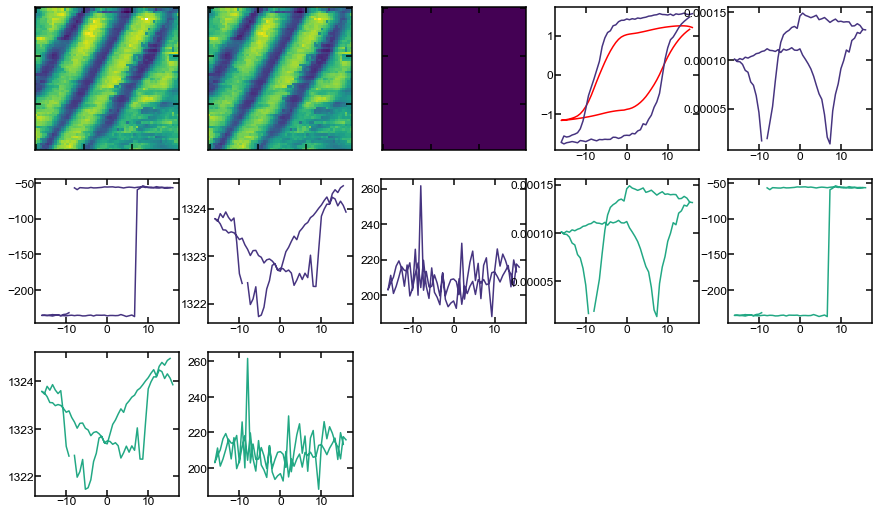

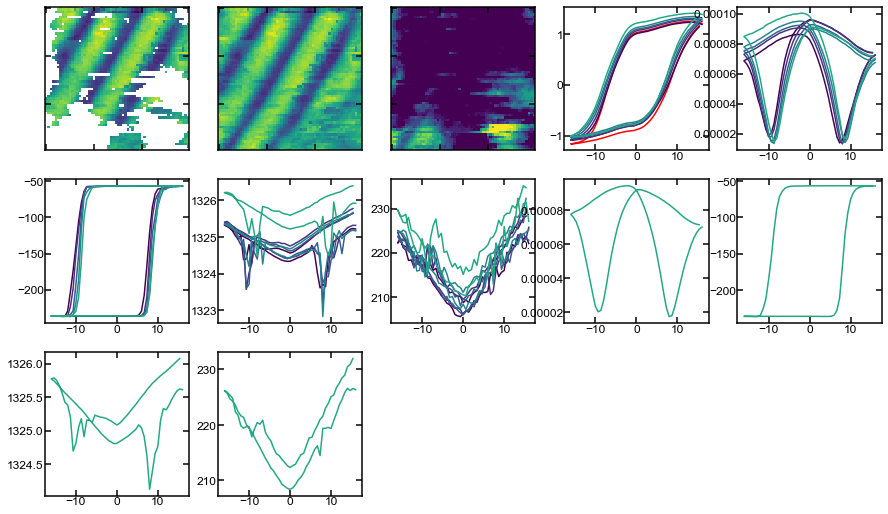

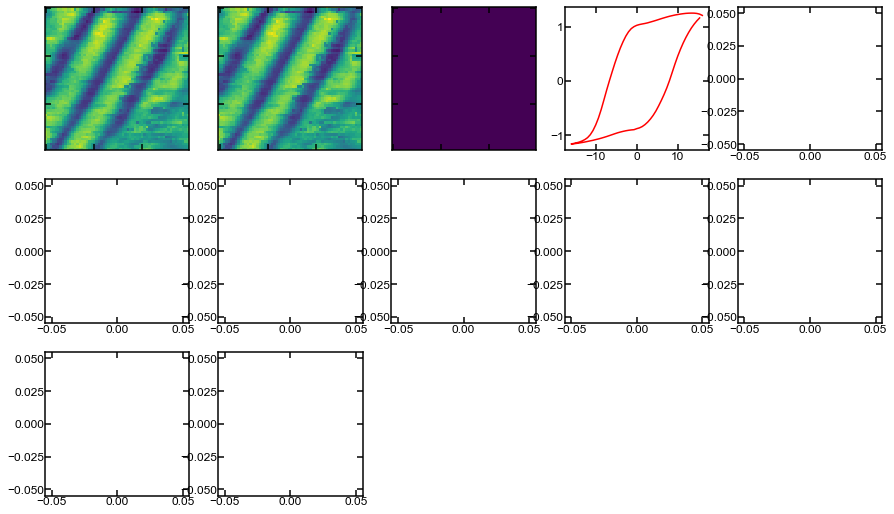

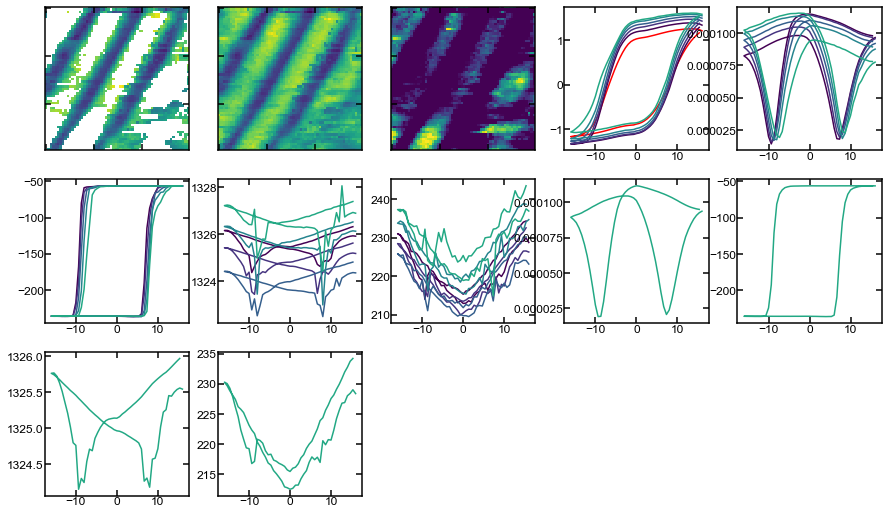

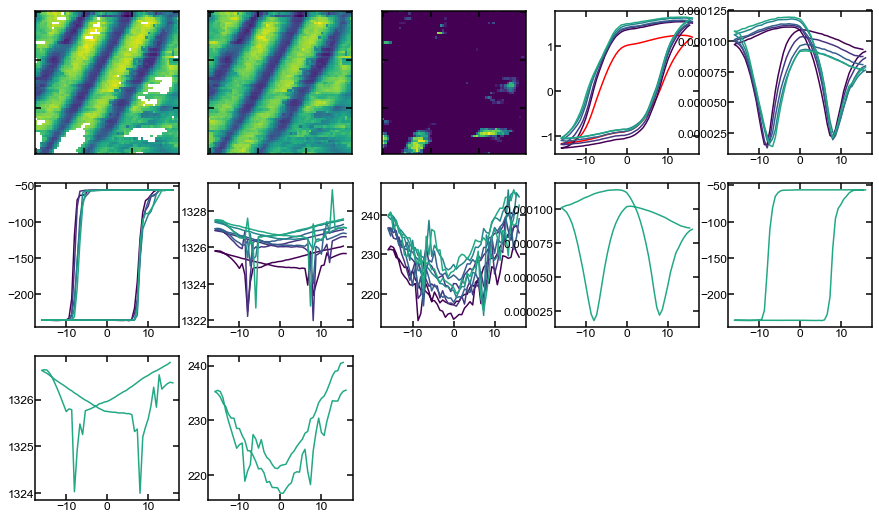

...

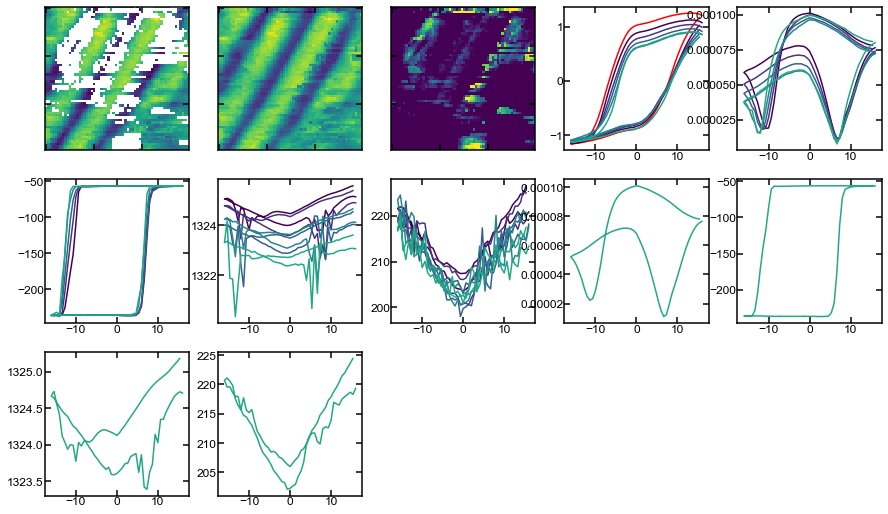

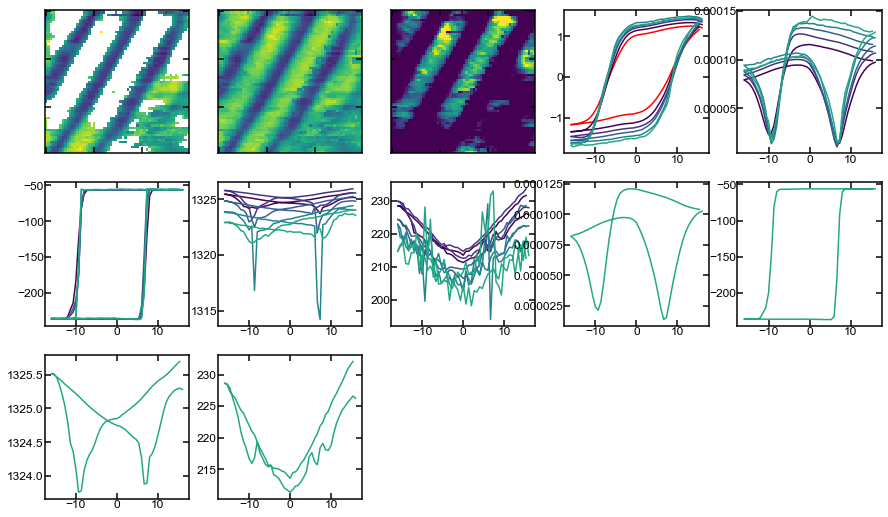

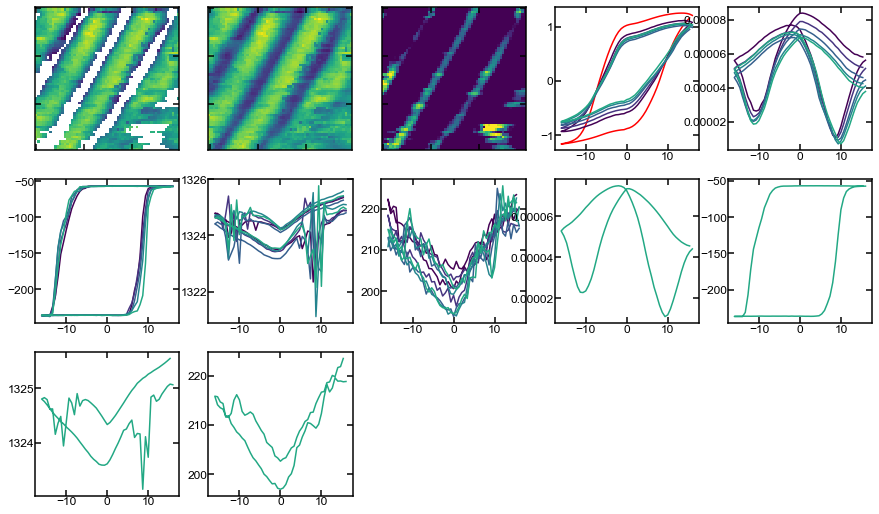

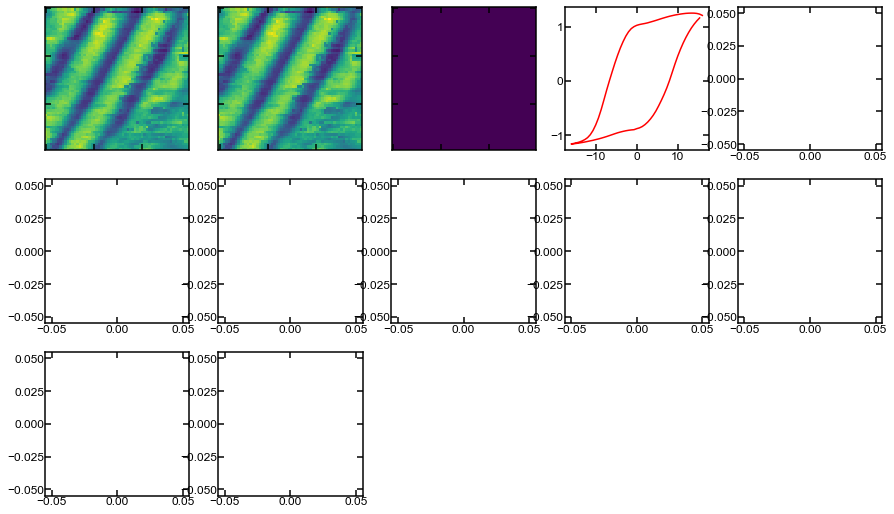

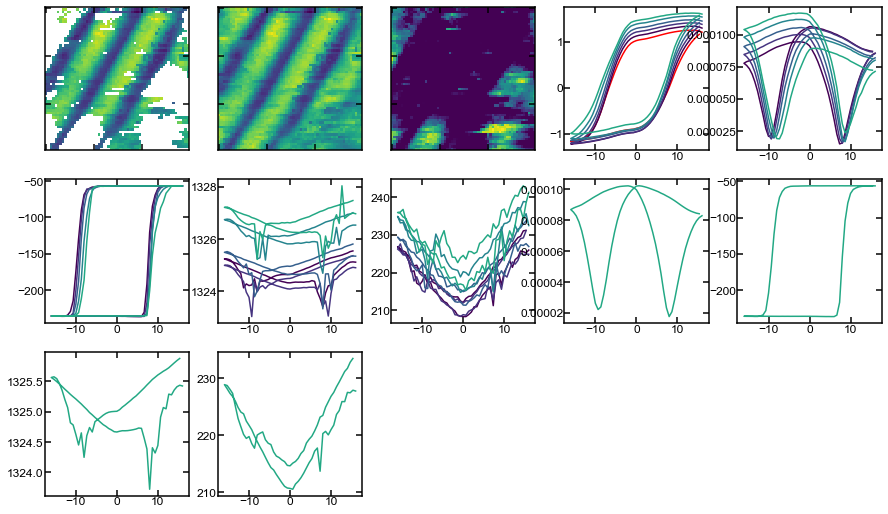

In [219]:
ranges = [0.01,0.06,0,0.02,.015,0.025,.06,0,0.025,.03,.1,.025,.1,.007,.02,0,.1]



def make_nan(data):
    data[np.where(~np.isfinite(data))] =np.nan
    return data

amp = data['OutA2_mixed'].reshape(-1,96)
amp = make_nan(amp)

phase = data['OutPhi2_mixed'].reshape(-1,96)
phase = make_nan(phase)

resonance = data['Outw2_mixed'].reshape(-1,96)
resonance = make_nan(resonance)

loss = data['OutQ1_mixed'].reshape(-1,96)
loss = make_nan(loss)



ranges = [0,0.18,0,0.11,0.1,.06,.11,0,.13,.06,.1,.11,.05,.18,0,.1]

ave_PE = np.average(PE_scaled.squeeze(), axis=0)

ave_embed = sf.get_ith_layer_output(model,np.atleast_3d(ave_PE), 5)

for i in range(embeddings.shape[1]):
    
    # Defines the colorlist
    cmap = plt.get_cmap('viridis')

    # Builds the graph structure
    fig, ax = sf.layout_graphs_of_arb_number(12)

    # shows the regions activated
    dat_hold = np.copy(data['Acosarea_mixed']).reshape(-1)
    dat_hold[np.where(embeddings[:, i] > 0)] = np.nan

    # plots the region activated
    ax[0].imshow(dat_hold.reshape(60, 60))
    ax[0].set_yticklabels('')
    ax[0].set_xticklabels('')

    # shows the regions activated
    dat_hold = np.copy(data['Acosarea_mixed']).reshape(-1)
    dat_hold[np.where(embeddings[:, i] > 0)] = np.nan

    # plots the region activated
    ax[1].imshow(data['Acosarea_mixed'])
    ax[1].set_yticklabels('')
    ax[1].set_xticklabels('')

    # plots the activation map
    ax[2].imshow(embeddings[:, i].reshape(60, 60), clim=[0,ranges[i]])
    ax[2].set_yticklabels('')
    ax[2].set_xticklabels('')
    

    # Plot the average and selected loops
    ax[3].plot(voltage, np.average(Piezoresponse.squeeze(), axis=0), 'r')
    
    
    idx = np.where(embeddings[:, i] > 0)
    ax[8].plot(voltage, np.nanmean(np.atleast_2d(
    amp[idx].squeeze()), axis=0), color=cmap(.15 * j))
        # Plot the average and selected loops
    ax[9].plot(voltage, np.nanmean(np.atleast_2d(
    phase[idx].squeeze()), axis=0), color=cmap(.15 * j))
        # Plot the average and selected loops
    ax[10].plot(voltage, np.nanmean(np.atleast_2d(
    resonance[idx].squeeze()), axis=0), color=cmap(.15 * j))
        # Plot the average and selected loops
    ax[11].plot(voltage, np.nanmean(np.atleast_2d(
    loss[idx].squeeze()), axis=0), color=cmap(.15 * j))
    
    
    for j in range(5):
        idx = np.where((embeddings[:, i] > bins[j]) * (embeddings[:, i] < bins[j + 1]))

        # Plot the average and selected loops
        ax[3].plot(voltage, np.average(np.atleast_2d(
            Piezoresponse[idx].squeeze()), axis=0), color=cmap(.15 * j))
                # Plot the average and selected loops
        ax[4].plot(voltage, np.nanmean(np.atleast_2d(
            amp[idx].squeeze()), axis=0), color=cmap(.15 * j))
                # Plot the average and selected loops
        ax[5].plot(voltage, np.nanmean(np.atleast_2d(
            phase[idx].squeeze()), axis=0), color=cmap(.15 * j))
                # Plot the average and selected loops
        ax[6].plot(voltage, np.nanmean(np.atleast_2d(
            resonance[idx].squeeze()), axis=0), color=cmap(.15 * j))
                # Plot the average and selected loops
        ax[7].plot(voltage, np.nanmean(np.atleast_2d(
            loss[idx].squeeze()), axis=0), color=cmap(.15 * j))
        
        

In [214]:
np.where(~np.isfinite())

(array([ 2,  3,  3,  5,  6,  7,  9, 11, 15, 16, 16, 18, 20, 21, 21, 23, 24,
        25, 25, 28, 29, 30, 31, 32, 32, 34, 36, 37, 38, 38, 39, 44, 45, 46,
        46, 47, 48, 49, 54, 56, 61, 62, 64, 65, 66, 67, 69, 70, 71, 71, 72,
        73, 75, 77, 79, 80]),
 array([58, 11, 58, 59, 12, 60, 12, 60,  7,  6, 61,  8,  9, 10, 60,  6, 62,
         6, 62,  9, 10, 12, 12, 10, 60, 62, 63,  6,  9, 62, 10, 11, 10,  9,
        63,  8, 62, 61, 61, 59, 12, 59, 12, 63, 62, 12, 12, 60,  8, 61, 61,
        60, 59, 63, 57, 61]))

In [217]:
amp[np.where(~np.isfinite(amp))]=np.nan

In [181]:
np.average(np.atleast_2d(Piezoresponse[idx].squeeze()))

0.053251587412557512

In [22]:
import keras
from keras.models import Sequential, Input, Model
from keras.layers import (Dense, Conv1D, Convolution2D, GRU, LSTM, Recurrent, Bidirectional, TimeDistributed,
                          Dropout, Flatten, RepeatVector, Reshape, MaxPooling1D, UpSampling1D, BatchNormalization)
from keras.layers.core import Lambda
from keras.optimizers import Adam

array([ 0.        ,  0.02106024,  0.        ,  0.00414214,  0.        ,
        0.00051723,  0.00147706,  0.        ,  0.00166789,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.00077174], dtype=float32)

In [38]:
ave_embed

array([[ 0.        ,  0.02106024,  0.        ,  0.00414214,  0.        ,
         0.00051723,  0.00147706,  0.        ,  0.00166789,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.00077174]], dtype=float32)

In [80]:
PE_scaled = Piezoresponse
PE_scaled -= np.mean(PE_scaled.reshape(-1))
PE_scaled /= np.std(PE_scaled)
PE_scaled = np.atleast_3d(PE_scaled)

# builds the identical encoding model
model_decode = Sequential()
model_decode.add(RepeatVector(96,input_shape=(16,)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode.add(TimeDistributed(Dense(1, activation='linear')))

# Sets the layers to match the training model
model_decode.layers[1].set_weights((model.layers[7].get_weights()))
model_decode.layers[2].set_weights((model.layers[8].get_weights()))
model_decode.layers[3].set_weights((model.layers[9].get_weights()))
model_decode.layers[4].set_weights((model.layers[10].get_weights()))
model_decode.layers[5].set_weights((model.layers[11].get_weights()))
model_decode.layers[6].set_weights((model.layers[12].get_weights()))

model.compile(Adam(3e-5), loss='mse')

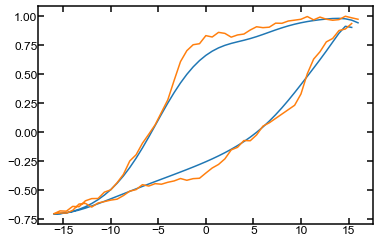

In [151]:
from sklearn.metrics import mean_squared_error

#i = np.random.randint(0, 3600)
generated = model.predict(np.rollaxis(np.atleast_3d(PE_scaled[i]),1)).squeeze()
mean_squared_error(PE_scaled[i], generated)

plt.plot(voltage,generated)
plt.plot(voltage, PE_scaled[i])
#plt.plot(voltage,ave_PE)

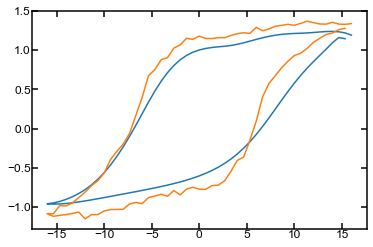

In [88]:
plt.plot(voltage,generated)
plt.plot(voltage,PE_scaled[300])
#plt.plot(voltage,ave_PE)

In [50]:
model.to_json()

'{"class_name": "Sequential", "config": [{"class_name": "Bidirectional", "config": {"name": "bidirectional_19", "trainable": true, "batch_input_shape": [null, 96, 1], "dtype": "float32", "layer": {"class_name": "LSTM", "config": {"name": "lstm_19", "trainable": true, "return_sequences": true, "return_state": false, "go_backwards": false, "stateful": false, "unroll": false, "implementation": 0, "units": 32, "activation": "tanh", "recurrent_activation": "hard_sigmoid", "use_bias": true, "kernel_initializer": {"class_name": "VarianceScaling", "config": {"scale": 1.0, "mode": "fan_avg", "distribution": "uniform", "seed": null}}, "recurrent_initializer": {"class_name": "Orthogonal", "config": {"gain": 1.0, "seed": null}}, "bias_initializer": {"class_name": "Zeros", "config": {}}, "unit_forget_bias": true, "kernel_regularizer": null, "recurrent_regularizer": null, "bias_regularizer": null, "activity_regularizer": null, "kernel_constraint": null, "recurrent_constraint": null, "bias_constraint

In [7]:
import math

def sigmoid(x):
  return 1 / (1 + np.exp(-x))

In [20]:
def ReLU(x):
    return x * (x > 0)

In [5]:
x = np.linspace(-1,1,100)
y = ReLU(x)


NameError: name 'ReLU' is not defined

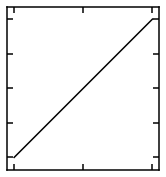

In [6]:
fig, ax = sf.layout_graphs_of_arb_number(1)
ax[0].plot(x,x,'k')
ax[0].set_yticklabels('')
ax[0].set_xticklabels('')
ax[0].axis('equal')
sf.savefig('linear',print_PNG=True)

In [88]:
#model_path = './32x5_auto/'

# loads the model
model2 = keras.models.load_model('bad_loops/weights.69020-0.00.hdf5')



#Use if loading embeddings from file
#embeddings = sf.get_activations(model_path +'_out.npy')
#embeddings = sf.get_activations('download_out.npy')

In [55]:
model2.layers[1]

In [89]:
# Use if computing embeddings from model
embeddings = sf.get_activations(model2, Piezoresponse,1)

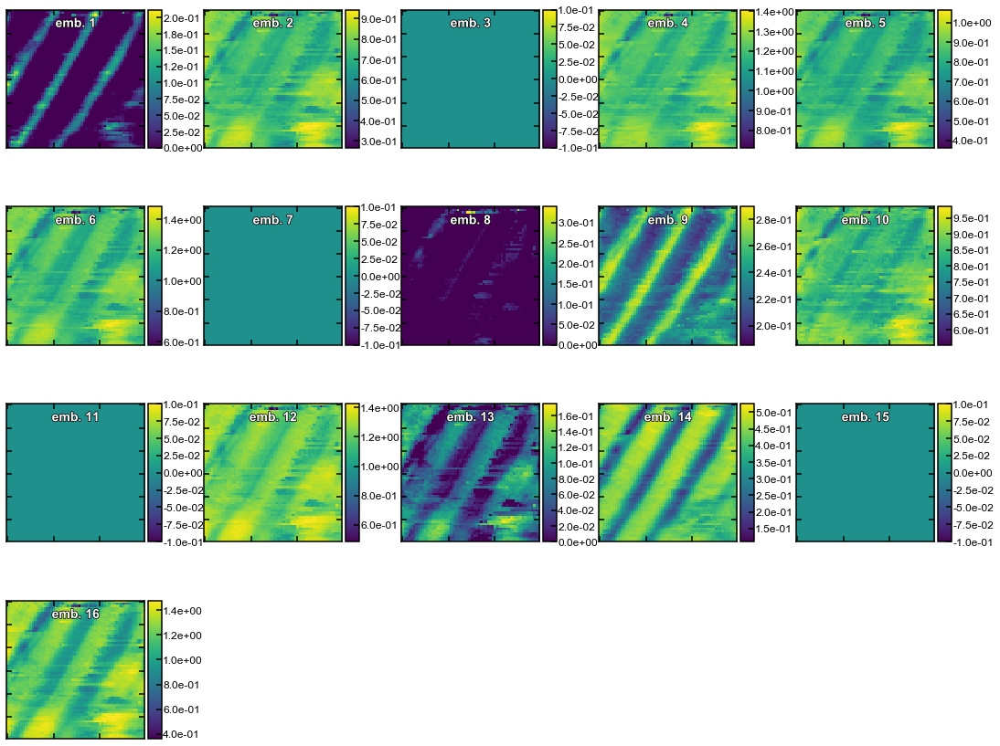

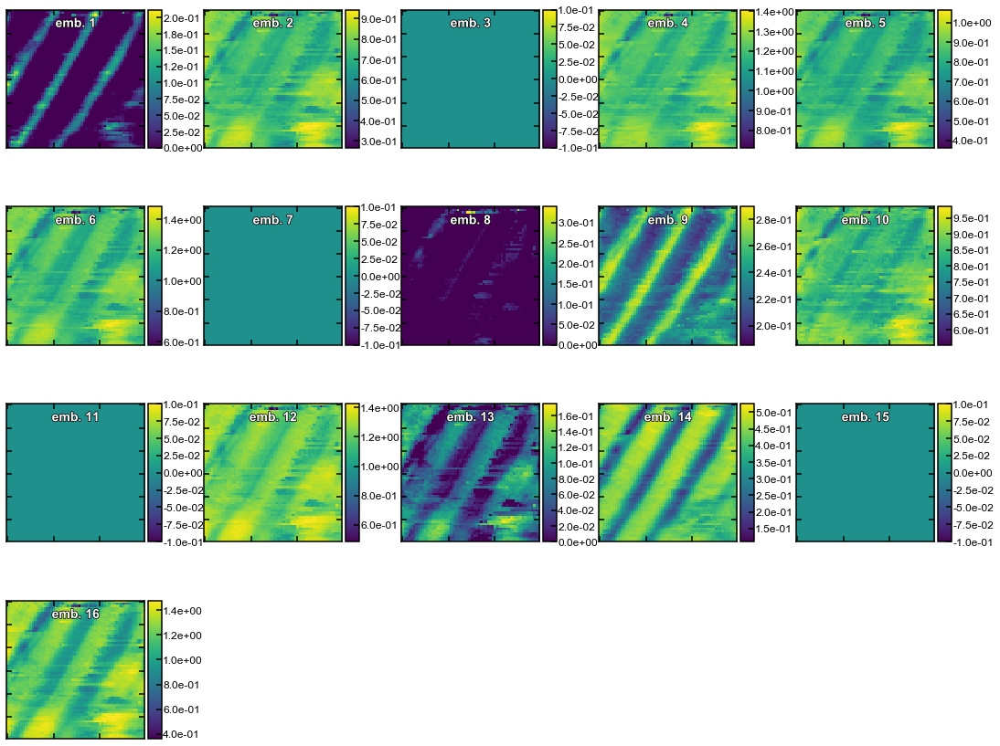

In [90]:
sf.plot_embedding_maps(embeddings,print_EPS=True, filename='bad_loops/embedding')